<a href="https://colab.research.google.com/github/Karolina-Bogacka/transbajki/blob/master/forecastking2_the_two_models.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!ls drive/MyDrive

'Advanced ML (For the Non-Advanced) .gdoc'	'IMG_4438[1705].gdoc'
 Barrows.zip					'IMG_4438[1705].jpg'
 CCPresentationNotes.gdoc			 IMG.gdoc
'CNN letter Dataset'				 IMG.jpg
'Colab Notebooks'				'Inni ludzie.gdoc'
 content					'Jury Mail.gdoc'
 data-local.zip					 masters.gdoc
 data.zip					 master-thesis-results
 Data.zip					'medytujący google docs.gdoc'
'Deprecated: LineOfLeastResistance_Tests.gdoc'	 methodology.gdoc
'dlt :T:T:T:T:T:T:T.gdoc'			 parsed-group.csv
'Dokument bez tytułu (1).gdoc'			'poetry generation.gdoc'
'Dokument bez tytułu.gdoc'			 rowerki
'fl experiments.gdoc'				 rowerki.zip
 frozen_east_text_detection.pb			 ssh.gdoc
 git.gdoc					 Teams.gsheet
 Github						 token.gdoc
'grouped-weather-rowerki(2).csv'		 trolls


In [ ]:
! unzip drive/MyDrive/rowerki.zip

Archive:  drive/MyDrive/rowerki.zip
replace rowerki/1651933303.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

# OK, we have 2 ideas here to realize:
#### 1. Forecasting the traffic on a given station for a given day based on previous data in order to estimate how much money are we going to lose if we shut down this station (assuming, for example, that people won't rent bikes that won't be there and will instead choose some different means of transportation)
#### 2. Analyzing where to put the third station by finding the most overcrowded stations (first by looking for stations and how much overcrowded are they throughout the day, then maybe treating the whole thing like a graph and finding neighbouring threes of stations that are frequently overcrowded together)

## 1. Forecasting traffic on a given station
### Load data

In [ ]:
!pip install meteostat
!pip install featuretools
!pip install darts

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
ERROR: Operation cancelled by user
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached darts-0.19.0-py3-none-any.whl (370 kB)
  Using cached pmdarima-1.8.5-cp37-cp37m-manylinux_2_17_x86_64.manylinux2014_x86_64.manylinux_2_24_x86_64.whl (1.4 MB)
  Using cached statsforecast-0.5.5-py3-none-any.whl (35 kB)
  Using cached matplotlib-3.5.2-cp37-cp37m-manylinux_2_5_x86_64.manylinux1_x86_64.whl (11.2 MB)
  Using cached ipython-7.34.0-py3-none-any.whl (793 kB)
  Using cached nfoursid-1.0.1-py3-none-any.whl (16 kB)
  Using cached pytorch_lightning-1.6.4-py3-none-any.whl (585 kB)
  Using cached tbats-1.1.0-py3-none-any.whl (43 kB)
  Using cached statsmodels-0.13.2-cp37-cp37m-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (9.8 MB)
  Using ca

In [ ]:
import pandas as pd
from functools import partial, reduce
import numpy as np
import requests
import glob
from sklearn.preprocessing import OrdinalEncoder
import matplotlib.pyplot as plt
import math
import datetime
from featuretools.primitives import NumericLag
import seaborn as sns
from datetime import datetime
from meteostat import Point, Daily, Stations, Hourly

/usr/local/lib/python3.7/dist-packages/woodwork/__init__.py:23: FutureWarning: Woodwork may not support Python 3.7 in next non-bugfix release.
  "Woodwork may not support Python 3.7 in next non-bugfix release.", FutureWarning
/usr/local/lib/python3.7/dist-packages/featuretools/__init__.py:67: FutureWarning: Featuretools may not support Python 3.7 in next non-bugfix release.
  FutureWarning,


In [ ]:
to_read = glob.glob("rowerki/*.csv")
rowerki_df = pd.concat(map(pd.read_csv, to_read))

In [ ]:
rowerki_df.head()

,date,station_id,bike_number,bike_type,state
0,2022-05-09 23:04,2585259,28661,174,ok
1,2022-05-09 23:04,2585259,28525,174,ok
2,2022-05-09 23:04,2585259,28428,174,ok
3,2022-05-09 23:04,2585259,28001,174,ok
4,2022-05-09 23:04,2585259,27980,174,ok


In [ ]:
len(rowerki_df)

23307413

### Get the number of incoming bikes
So we need to check for each row of a station whether the bike already appeared in the previous measurement (yeah, so we have the measurements, and that gives us incoming
OR we get the number of bikes for a given measurement and see the fluctuations, and if the number lessens that's potential rented bikes there. So we use the Lazy Consumer Hypothesis xD maybe that if the consumer would have to go to a different station they would choose sth different, whereas the guy renting will just leave the bike anywhere

so get total outgoing clients for a measurement and then for a day

So there are different numbers of bikes present throughout the day. 

In [ ]:
rowerki_df.groupby(['date'])['bike_number'].nunique().value_counts()

4460    19
4551    17
4592    17
4452    17
4577    17
        ..
3739     1
3756     1
3711     1
3530     1
3726     1
Name: bike_number, Length: 1377, dtype: int64

In [ ]:
grouped_df = rowerki_df.groupby(['date', 'station_id'])['bike_number'].nunique().reset_index()
grouped_df.head()

,date,station_id,bike_number
0,2022-04-24 15:44,448565,3
1,2022-04-24 15:44,448566,3
2,2022-04-24 15:44,1154451,6
3,2022-04-24 15:44,2585259,19
4,2022-04-24 15:44,2585263,12


In [ ]:
grouped_df['Day'] = pd.to_datetime(grouped_df['date']).dt.day
grouped_df.head()

,date,station_id,bike_number,Day
0,2022-04-24 15:44,448565,3,24
1,2022-04-24 15:44,448566,3,24
2,2022-04-24 15:44,1154451,6,24
3,2022-04-24 15:44,2585259,19,24
4,2022-04-24 15:44,2585263,12,24


In [ ]:
grouped_df['Month'] = pd.to_datetime(grouped_df['date']).dt.month
grouped_df.head()

,date,station_id,bike_number,Day,Month
0,2022-04-24 15:44,448565,3,24,4
1,2022-04-24 15:44,448566,3,24,4
2,2022-04-24 15:44,1154451,6,24,4
3,2022-04-24 15:44,2585259,19,24,4
4,2022-04-24 15:44,2585263,12,24,4


In [ ]:
grouped_df['Weekday'] = pd.to_datetime(grouped_df['date']).dt.dayofweek
grouped_df.head()

,date,station_id,bike_number,Day,Month,Weekday
0,2022-04-24 15:44,448565,3,24,4,6
1,2022-04-24 15:44,448566,3,24,4,6
2,2022-04-24 15:44,1154451,6,24,4,6
3,2022-04-24 15:44,2585259,19,24,4,6
4,2022-04-24 15:44,2585263,12,24,4,6


In [ ]:
grouped_df['Hour'] = pd.to_datetime(grouped_df['date']).dt.hour
grouped_df.head()

,date,station_id,bike_number,Day,Month,Weekday,Hour
0,2022-04-24 15:44,448565,3,24,4,6,15
1,2022-04-24 15:44,448566,3,24,4,6,15
2,2022-04-24 15:44,1154451,6,24,4,6,15
3,2022-04-24 15:44,2585259,19,24,4,6,15
4,2022-04-24 15:44,2585263,12,24,4,6,15


here, for each station get to previous measurement and subtract.

In [ ]:
grouped_df.head()

,date,station_id,bike_number,Day,Month,Weekday,Hour
0,2022-04-24 15:44,448565,3,24,4,6,15
1,2022-04-24 15:44,448566,3,24,4,6,15
2,2022-04-24 15:44,1154451,6,24,4,6,15
3,2022-04-24 15:44,2585259,19,24,4,6,15
4,2022-04-24 15:44,2585263,12,24,4,6,15


In [ ]:
grouped_df['diff'] = -(grouped_df.groupby(['station_id'])['bike_number'].diff(1))
grouped_df['diff'] = [d if d > 0 else 0.0 for d in grouped_df['diff'] ]
grouped_df[grouped_df['station_id']==2585982].head(50)

,date,station_id,bike_number,Day,Month,Weekday,diff
253,2022-04-24 15:44,2585982,9,24,4,6,0.0
594,2022-04-24 15:51,2585982,8,24,4,6,1.0
937,2022-04-24 16:21,2585982,10,24,4,6,0.0
1279,2022-04-24 16:51,2585982,10,24,4,6,0.0
1619,2022-04-24 17:18,2585982,9,24,4,6,1.0
1963,2022-04-24 17:21,2585982,9,24,4,6,0.0
2305,2022-04-24 17:39,2585982,7,24,4,6,2.0
2651,2022-04-24 17:51,2585982,10,24,4,6,0.0
2999,2022-04-24 18:21,2585982,19,24,4,6,0.0
3345,2022-04-24 18:51,2585982,19,24,4,6,0.0


In [ ]:
grouped_df.groupby(['station_id','Month','Day', 'Hour','Weekday'])['diff'].sum().reset_index()

,station_id,Month,Day,Hour,Weekday,diff
0,448565,4,24,15,6,0.0
1,448565,4,24,16,6,3.0
2,448565,4,24,17,6,4.0
3,448565,4,24,18,6,1.0
4,448565,4,24,19,6,0.0
...,...,...,...,...,...,...
388136,55316960,6,10,10,4,0.0
388137,55316960,6,10,11,4,0.0
388138,55316960,6,10,12,4,0.0
388139,55316960,6,10,13,4,0.0


In [ ]:
grouped_df = grouped_df.groupby(['station_id','Month','Day', 'Hour','Weekday'])['diff'].sum().reset_index()
grouped_df[grouped_df['station_id']==2585982].head(50)

,station_id,Month,Day,Hour,Weekday,diff
288350,2585982,4,24,15,6,1.0
288351,2585982,4,24,16,6,0.0
288352,2585982,4,24,17,6,3.0
288353,2585982,4,24,18,6,0.0
288354,2585982,4,24,19,6,4.0
288355,2585982,4,24,20,6,1.0
288356,2585982,4,24,21,6,1.0
288357,2585982,4,24,22,6,2.0
288358,2585982,4,24,23,6,1.0
288359,2585982,4,25,0,0,0.0


In [ ]:
json = requests.get("https://nextbike.net/maps/nextbike-official.json?city=372,210,475").json()
data = []
for city in json["countries"][0]['cities']:
    for place in city['places']:
        data.append({col: place[col] for col in ['uid', 'lat', 'lng', 'name','bike_racks']})
stations = pd.DataFrame(data)
stations.sort_values("bike_racks")

,uid,lat,lng,name,bike_racks
329,2681635,52.234390,20.999159,Spektrum Tower,11
342,18751910,52.183037,20.991542,Signum Work Station,12
348,55316960,52.196220,20.938810,Bolero,15
76,2585400,52.231450,20.988690,Prosta - Wronia,15
267,2586001,52.247314,21.042731,Metro Stadion Narodowy,15
...,...,...,...,...,...
201,2585885,52.157289,21.044008,Rosoła - Ciszewskiego - SGGW,30
207,2585901,52.142720,21.038362,Pileckiego - Alternatywy,30
60,2585369,52.244947,21.001294,Andersa - Długa,30
311,4393742,52.239409,21.031010,Metro Centrum Nauki Kopernik,30


In [ ]:
grouped_df = pd.merge(grouped_df, stations, left_on='station_id', right_on='uid')
grouped_df.head()

,station_id,date,bike_number,uid,lat,lng,name,bike_racks
0,448565,2022-04-24 15:44,3,448565,52.183992,21.00984,Nestle House,15
1,448565,2022-04-24 15:51,4,448565,52.183992,21.00984,Nestle House,15
2,448565,2022-04-24 16:21,1,448565,52.183992,21.00984,Nestle House,15
3,448565,2022-04-24 16:51,5,448565,52.183992,21.00984,Nestle House,15
4,448565,2022-04-24 17:21,7,448565,52.183992,21.00984,Nestle House,15


In [ ]:
from meteostat import Stations

stations = Stations()
stations = stations.nearby(52.183992, 21.00984)
station = stations.fetch(1)

station

,name,country,region,wmo,icao,latitude,longitude,elevation,timezone,hourly_start,hourly_end,daily_start,daily_end,monthly_start,monthly_end,distance
id,,,,,,,,,,,,,,,,
12375,Warszawa-Okecie,PL,MZ,12375,EPWA,52.1667,20.9667,106.0,Europe/Warsaw,1928-01-02,2022-06-09,1952-01-02,2022-06-03,1953-01-01,2022-01-01,3514.367312


In [ ]:
grouped_df

,station_id,Month,Day,Hour,Weekday,diff,uid,lat,lng,name,bike_racks
0,448565,4,24,15,6,0.0,448565,52.183992,21.00984,Nestle House,15
1,448565,4,24,16,6,3.0,448565,52.183992,21.00984,Nestle House,15
2,448565,4,24,17,6,4.0,448565,52.183992,21.00984,Nestle House,15
3,448565,4,24,18,6,1.0,448565,52.183992,21.00984,Nestle House,15
4,448565,4,24,19,6,0.0,448565,52.183992,21.00984,Nestle House,15
...,...,...,...,...,...,...,...,...,...,...,...
388136,55316960,6,10,10,4,0.0,55316960,52.196220,20.93881,Bolero,15
388137,55316960,6,10,11,4,0.0,55316960,52.196220,20.93881,Bolero,15
388138,55316960,6,10,12,4,0.0,55316960,52.196220,20.93881,Bolero,15
388139,55316960,6,10,13,4,0.0,55316960,52.196220,20.93881,Bolero,15


In [ ]:
weather_df = grouped_df.groupby(['Month','Day','Hour'])['name'].count().reset_index().drop('name', axis=1)
weather_df

,Month,Day,Hour
0,4,24,15
1,4,24,16
2,4,24,17
3,4,24,18
4,4,24,19
...,...,...,...
1123,6,10,10
1124,6,10,11
1125,6,10,12
1126,6,10,13


In [ ]:
def get_weather(row):
  # weather for the hour (more or less) of the measurement
  start = datetime(2022, row['Month'], row['Day'], row['Hour'])
  end = datetime(2022, row['Month'], row['Day'], row.Hour)
  location = Point(float(52.183992), float(21.00984), 100)
  data = Hourly(location, start, end)
  data = data.fetch()
  row['temp'] = float(data['temp']) if not math.isnan(data['temp']) else 0.0
  row['dwpt'] = float(data['dwpt']) if not math.isnan(data['dwpt']) else 0.0
  row['rhum'] = float(data['rhum']) if not math.isnan(data['rhum']) else 0.0
  row['prcp'] = float(data['prcp']) if not math.isnan(data['prcp']) else 0.0
  row['snow'] = float(data['snow']) if not math.isnan(data['snow']) else 0.0
  row['wdir'] = float(data['wdir']) if not math.isnan(data['wdir']) else 0.0
  row['wspd'] = float(data['wspd']) if not math.isnan(data['wspd']) else 0.0
  row['wpgt'] = float(data['wpgt']) if not math.isnan(data['wpgt']) else 0.0
  row['pres'] = float(data['pres']) if not math.isnan(data['pres']) else 0.0
  row['tsun'] = float(data['tsun']) if not math.isnan(data['tsun']) else 0.0
  row['coco'] = float(data['coco']) if not math.isnan(data['coco']) else 0.0
  return row

weather_df2 = weather_df.apply(get_weather, axis=1)
weather_df2

,Month,Day,Hour,temp,dwpt,rhum,prcp,snow,wdir,wspd,wpgt,pres,tsun,coco
0,4.0,24.0,15.0,14.9,4.6,50.0,0.0,0.0,30.0,14.4,18.5,1005.2,0.0,3.0
1,4.0,24.0,16.0,14.0,4.3,52.0,0.0,0.0,50.0,18.0,22.2,1005.2,0.0,2.0
2,4.0,24.0,17.0,13.2,4.1,54.0,0.0,0.0,40.0,21.6,22.2,1004.6,0.0,2.0
3,4.0,24.0,18.0,12.4,4.4,58.0,0.0,0.0,60.0,18.0,22.2,1004.3,0.0,4.0
4,4.0,24.0,19.0,11.9,4.4,60.0,0.0,0.0,60.0,21.6,22.2,1004.6,0.0,7.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1123,6.0,10.0,10.0,23.0,17.0,69.0,0.0,0.0,290.0,22.0,0.0,1017.0,0.0,0.0
1124,6.0,10.0,11.0,24.0,17.0,65.0,0.0,0.0,310.0,22.0,0.0,1017.0,0.0,0.0
1125,6.0,10.0,12.0,23.0,16.5,67.0,0.0,0.0,290.0,22.0,0.0,1017.6,0.0,3.0
1126,6.0,10.0,13.0,22.0,16.9,73.0,0.0,0.0,290.0,26.0,0.0,1018.0,0.0,0.0


In [ ]:
weather_df2

,Month,Day,Hour,temp,dwpt,rhum,prcp,snow,wdir,wspd,wpgt,pres,tsun,coco
0,4.0,24.0,15.0,14.9,4.6,50.0,0.0,0.0,30.0,14.4,18.5,1005.2,0.0,3.0
1,4.0,24.0,16.0,14.0,4.3,52.0,0.0,0.0,50.0,18.0,22.2,1005.2,0.0,2.0
2,4.0,24.0,17.0,13.2,4.1,54.0,0.0,0.0,40.0,21.6,22.2,1004.6,0.0,2.0
3,4.0,24.0,18.0,12.4,4.4,58.0,0.0,0.0,60.0,18.0,22.2,1004.3,0.0,4.0
4,4.0,24.0,19.0,11.9,4.4,60.0,0.0,0.0,60.0,21.6,22.2,1004.6,0.0,7.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1123,6.0,10.0,10.0,23.0,17.0,69.0,0.0,0.0,290.0,22.0,0.0,1017.0,0.0,0.0
1124,6.0,10.0,11.0,24.0,17.0,65.0,0.0,0.0,310.0,22.0,0.0,1017.0,0.0,0.0
1125,6.0,10.0,12.0,23.0,16.5,67.0,0.0,0.0,290.0,22.0,0.0,1017.6,0.0,3.0
1126,6.0,10.0,13.0,22.0,16.9,73.0,0.0,0.0,290.0,26.0,0.0,1018.0,0.0,0.0


In [ ]:
full_df = grouped_df.merge(weather_df2, on=['Month', 'Day', 'Hour'])

In [ ]:
full_df.head()

,station_id,Month,Day,Hour,Weekday,diff,uid,lat,lng,name,...,dwpt,rhum,prcp,snow,wdir,wspd,wpgt,pres,tsun,coco
0,448565,4,24,15,6,0.0,448565,52.183992,21.009840,Nestle House,...,4.6,50.0,0.0,0.0,30.0,14.4,18.5,1005.2,0.0,3.0
1,448566,4,24,15,6,0.0,448566,52.177909,20.997491,New City,...,4.6,50.0,0.0,0.0,30.0,14.4,18.5,1005.2,0.0,3.0
2,1154451,4,24,15,6,2.0,1154451,52.230327,20.982705,Proximo,...,4.6,50.0,0.0,0.0,30.0,14.4,18.5,1005.2,0.0,3.0
3,2585259,4,24,15,6,0.0,2585259,52.296298,20.958358,Dewajtis - UKSW,...,4.6,50.0,0.0,0.0,30.0,14.4,18.5,1005.2,0.0,3.0
4,2585263,4,24,15,6,0.0,2585263,52.290974,20.929556,Metro Młociny,...,4.6,50.0,0.0,0.0,30.0,14.4,18.5,1005.2,0.0,3.0


In [ ]:
len(grouped_df)

388141

In [ ]:
grouped_df = full_df

In [ ]:
grouped_df.head()

,station_id,Month,Day,Hour,Weekday,diff,uid,lat,lng,name,...,dwpt,rhum,prcp,snow,wdir,wspd,wpgt,pres,tsun,coco
0,448565,4,24,15,6,0.0,448565,52.183992,21.009840,Nestle House,...,4.6,50.0,0.0,0.0,30.0,14.4,18.5,1005.2,0.0,3.0
1,448566,4,24,15,6,0.0,448566,52.177909,20.997491,New City,...,4.6,50.0,0.0,0.0,30.0,14.4,18.5,1005.2,0.0,3.0
2,1154451,4,24,15,6,2.0,1154451,52.230327,20.982705,Proximo,...,4.6,50.0,0.0,0.0,30.0,14.4,18.5,1005.2,0.0,3.0
3,2585259,4,24,15,6,0.0,2585259,52.296298,20.958358,Dewajtis - UKSW,...,4.6,50.0,0.0,0.0,30.0,14.4,18.5,1005.2,0.0,3.0
4,2585263,4,24,15,6,0.0,2585263,52.290974,20.929556,Metro Młociny,...,4.6,50.0,0.0,0.0,30.0,14.4,18.5,1005.2,0.0,3.0


In [ ]:
grouped_df.drop(['uid', 'lat', 'lng', 'name', 'bike_racks'], inplace=True, axis=1)

In [ ]:
grouped_df.head()

,station_id,Month,Day,Hour,Weekday,diff,temp,dwpt,rhum,prcp,snow,wdir,wspd,wpgt,pres,tsun,coco
0,448565,4,24,15,6,0.0,14.9,4.6,50.0,0.0,0.0,30.0,14.4,18.5,1005.2,0.0,3.0
1,448566,4,24,15,6,0.0,14.9,4.6,50.0,0.0,0.0,30.0,14.4,18.5,1005.2,0.0,3.0
2,1154451,4,24,15,6,2.0,14.9,4.6,50.0,0.0,0.0,30.0,14.4,18.5,1005.2,0.0,3.0
3,2585259,4,24,15,6,0.0,14.9,4.6,50.0,0.0,0.0,30.0,14.4,18.5,1005.2,0.0,3.0
4,2585263,4,24,15,6,0.0,14.9,4.6,50.0,0.0,0.0,30.0,14.4,18.5,1005.2,0.0,3.0


In [ ]:
grouped_df.corr()

,station_id,Month,Day,Hour,Weekday,diff,temp,dwpt,rhum,prcp,snow,wdir,wspd,wpgt,pres,tsun,coco
station_id,1.000000,-0.000304,0.001899,-0.003050,0.000289,-0.034696,0.002123,0.002166,0.000342,0.001168,NaN,0.000580,0.002755,0.001092,-0.002199,NaN,0.000819
Month,-0.000304,1.000000,-0.650831,-0.029879,0.033623,0.085516,0.493285,0.562327,0.083134,0.105772,NaN,0.001821,0.003760,-0.384263,-0.171791,NaN,-0.218961
Day,0.001899,-0.650831,1.000000,0.013071,-0.020255,-0.056914,-0.316128,-0.132166,0.173662,0.078583,NaN,0.093108,0.060572,0.322753,-0.187098,NaN,0.216775
Hour,-0.003050,-0.029879,0.013071,1.000000,0.011039,0.127539,0.230229,-0.051068,-0.274439,-0.028861,NaN,0.072874,0.070631,0.068319,-0.033567,NaN,-0.030055
Weekday,0.000289,0.033623,-0.020255,0.011039,1.000000,0.007076,0.019744,0.078760,0.026151,-0.066806,NaN,0.138790,0.145620,0.125475,0.039200,NaN,0.047588
diff,-0.034696,0.085516,-0.056914,0.127539,0.007076,1.000000,0.274452,0.004157,-0.238273,-0.019593,NaN,0.050960,0.093610,0.046059,-0.002113,NaN,-0.066044
temp,0.002123,0.493285,-0.316128,0.230229,0.019744,0.274452,1.000000,0.403959,-0.507353,-0.034536,NaN,0.127419,0.236108,-0.064210,-0.197238,NaN,-0.153451
dwpt,0.002166,0.562327,-0.132166,-0.051068,0.078760,0.004157,0.403959,1.000000,0.565427,0.159342,NaN,0.145289,0.010202,-0.310674,-0.597514,NaN,0.092365
rhum,0.000342,0.083134,0.173662,-0.274439,0.026151,-0.238273,-0.507353,0.565427,1.000000,0.196603,NaN,0.030667,-0.226692,-0.243623,-0.387591,NaN,0.248765
prcp,0.001168,0.105772,0.078583,-0.028861,-0.066806,-0.019593,-0.034536,0.159342,0.196603,1.000000,NaN,0.034535,-0.023196,0.037493,-0.186638,NaN,0.026899


In [ ]:
grouped_df.drop(['snow', 'tsun'], inplace=True, axis=1)
grouped_df.head()

,station_id,Month,Day,Hour,Weekday,diff,temp,dwpt,rhum,prcp,wdir,wspd,wpgt,pres,coco
0,448565,4,24,15,6,0.0,14.9,4.6,50.0,0.0,30.0,14.4,18.5,1005.2,3.0
1,448566,4,24,15,6,0.0,14.9,4.6,50.0,0.0,30.0,14.4,18.5,1005.2,3.0
2,1154451,4,24,15,6,2.0,14.9,4.6,50.0,0.0,30.0,14.4,18.5,1005.2,3.0
3,2585259,4,24,15,6,0.0,14.9,4.6,50.0,0.0,30.0,14.4,18.5,1005.2,3.0
4,2585263,4,24,15,6,0.0,14.9,4.6,50.0,0.0,30.0,14.4,18.5,1005.2,3.0


In [ ]:
grouped_df.head()

,Hour,Day,station_id,Month,Weekday,diff,temp,dwpt,rhum,prcp,wdir,wspd,wpgt,pres,coco
0,0,1,448565,5,6,0.0,6.8,1.9,71.0,0.0,250.0,3.6,9.3,1022.6,3.0
1,0,1,448566,5,6,0.0,6.8,1.9,71.0,0.0,250.0,3.6,9.3,1022.6,3.0
2,0,1,1154451,5,6,0.0,6.8,1.9,71.0,0.0,250.0,3.6,9.3,1022.6,3.0
3,0,1,2585259,5,6,0.0,6.8,1.9,71.0,0.0,250.0,3.6,9.3,1022.6,3.0
4,0,1,2585263,5,6,0.0,6.8,1.9,71.0,0.0,250.0,3.6,9.3,1022.6,3.0


In [ ]:
!pip3 install holidays

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import holidays
import datetime
# Select country
holidays.Poland(years = 2022)

{datetime.date(2022, 1, 1): 'Nowy Rok', datetime.date(2022, 1, 6): 'Święto Trzech Króli', datetime.date(2022, 4, 17): 'Niedziela Wielkanocna', datetime.date(2022, 4, 18): 'Poniedziałek Wielkanocny', datetime.date(2022, 5, 1): 'Święto Państwowe', datetime.date(2022, 5, 3): 'Święto Narodowe Trzeciego Maja', datetime.date(2022, 6, 5): 'Zielone Świątki', datetime.date(2022, 6, 16): 'Dzień Bożego Ciała', datetime.date(2022, 8, 15): 'Wniebowzięcie Najświętszej Marii Panny', datetime.date(2022, 11, 1): 'Uroczystość Wszystkich Świętych', datetime.date(2022, 11, 11): 'Narodowe Święto Niepodległości', datetime.date(2022, 12, 25): 'Boże Narodzenie (pierwszy dzień)', datetime.date(2022, 12, 26): 'Boże Narodzenie (drugi dzień)'}

In [ ]:
grouped_df["Holiday"] = [int(datetime.datetime(2022,int(g['Month']),int(g['Day'])) in holidays.Poland(years=2022)) for i,g in grouped_df.iterrows()]

In [ ]:
grouped_df[grouped_df['station_id'] == 2585982].corr()

,station_id,Month,Day,Hour,Weekday,diff,temp,dwpt,rhum,prcp,wdir,wspd,wpgt,pres,coco,Holiday
station_id,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Month,NaN,1.000000,-0.650330,-2.984296e-02,0.033151,0.119600,0.491626,0.561816,0.084694,0.106026,0.001485,0.003994,-0.383792,-0.173429,-0.217225,1.190699e-01
Day,NaN,-0.650330,1.000000,1.241511e-02,-0.020352,-0.049617,-0.314573,-0.131116,0.173161,0.078181,0.092795,0.060802,0.321437,-0.185404,0.215640,-3.306912e-01
Hour,NaN,-0.029843,0.012415,1.000000e+00,0.008700,0.259518,0.230257,-0.051165,-0.274693,-0.028349,0.072260,0.070260,0.068027,-0.032769,-0.031622,-1.298264e-16
Weekday,NaN,0.033151,-0.020352,8.700074e-03,1.000000,0.010581,0.020219,0.079795,0.027118,-0.066471,0.138934,0.144647,0.124502,0.039330,0.048166,1.870735e-01
diff,NaN,0.119600,-0.049617,2.595179e-01,0.010581,1.000000,0.351938,0.020531,-0.290649,-0.004579,0.076118,0.117047,0.060406,-0.024778,-0.081014,-2.751102e-02
temp,NaN,0.491626,-0.314573,2.302569e-01,0.020219,0.351938,1.000000,0.404809,-0.506309,-0.033561,0.128668,0.237168,-0.062150,-0.200910,-0.150997,-5.476471e-03
dwpt,NaN,0.561816,-0.131116,-5.116519e-02,0.079795,0.020531,0.404809,1.000000,0.565692,0.159524,0.146138,0.010467,-0.309531,-0.598931,0.093697,-1.156737e-01
rhum,NaN,0.084694,0.173161,-2.746933e-01,0.027118,-0.290649,-0.506309,0.565692,1.000000,0.196061,0.030493,-0.227233,-0.244635,-0.386211,0.247930,-1.131085e-01
prcp,NaN,0.106026,0.078181,-2.834863e-02,-0.066471,-0.004579,-0.033561,0.159524,0.196061,1.000000,0.034528,-0.022518,0.036965,-0.186390,0.026839,-4.853372e-02


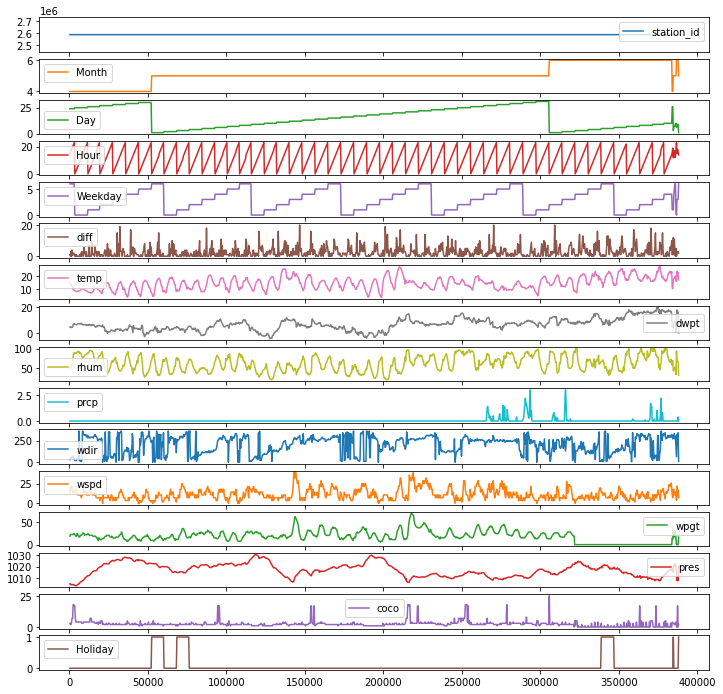

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns


grouped_df[grouped_df['station_id'] == 2585982].plot(subplots=True, sharex=True, figsize=(12,12))
plt.show()

In [ ]:
df = pd.concat(to_conc)
df.sort_values(['Month', 'Day', 'Hour', 'station_id'],inplace=True)

In [ ]:
grouped_df = df

In [ ]:
from sklearn.preprocessing import OrdinalEncoder

ord_enc = OrdinalEncoder()
grouped_df["station_id"] = ord_enc.fit_transform(grouped_df[["station_id"]])
grouped_df.head(11)

,station_id,Month,Day,Hour,Weekday,diff,temp,dwpt,rhum,prcp,wdir,wspd,wpgt,pres,coco,Holiday,prev,prev2
691,0.0,4,24,17,6,4.0,13.2,4.1,54.0,0.0,40.0,21.6,22.2,1004.6,2.0,0,3.0,0.0
692,1.0,4,24,17,6,4.0,13.2,4.1,54.0,0.0,40.0,21.6,22.2,1004.6,2.0,0,0.0,0.0
693,2.0,4,24,17,6,2.0,13.2,4.1,54.0,0.0,40.0,21.6,22.2,1004.6,2.0,0,2.0,2.0
694,3.0,4,24,17,6,3.0,13.2,4.1,54.0,0.0,40.0,21.6,22.2,1004.6,2.0,0,3.0,0.0
695,4.0,4,24,17,6,6.0,13.2,4.1,54.0,0.0,40.0,21.6,22.2,1004.6,2.0,0,2.0,0.0
696,5.0,4,24,17,6,10.0,13.2,4.1,54.0,0.0,40.0,21.6,22.2,1004.6,2.0,0,0.0,2.0
697,6.0,4,24,17,6,16.0,13.2,4.1,54.0,0.0,40.0,21.6,22.2,1004.6,2.0,0,1.0,0.0
698,7.0,4,24,17,6,8.0,13.2,4.1,54.0,0.0,40.0,21.6,22.2,1004.6,2.0,0,2.0,0.0
699,8.0,4,24,17,6,2.0,13.2,4.1,54.0,0.0,40.0,21.6,22.2,1004.6,2.0,0,1.0,0.0
700,9.0,4,24,17,6,9.0,13.2,4.1,54.0,0.0,40.0,21.6,22.2,1004.6,2.0,0,6.0,0.0


In [ ]:
y = grouped_df.pop('diff')

In [ ]:
from sklearn.preprocessing import StandardScaler
scalar = StandardScaler()
df_scaled = pd.DataFrame(scalar.fit_transform(grouped_df), columns=grouped_df.columns)
df_scaled

,station_id,Month,Day,Hour,Weekday,temp,dwpt,rhum,prcp,wdir,wspd,wpgt,pres,coco,Holiday,prev,prev2
0,-1.728969,-1.850595,0.884974,0.799042,1.559616,-0.284269,-0.515190,-0.406511,-0.187003,-1.586451,1.465100,0.299554,-2.196939,-0.203684,-0.260759,0.755945,-0.582244
1,-1.719000,-1.850595,0.884974,0.799042,1.559616,-0.284269,-0.515190,-0.406511,-0.187003,-1.586451,1.465100,0.299554,-2.196939,-0.203684,-0.260759,-0.582808,-0.582244
2,-1.709030,-1.850595,0.884974,0.799042,1.559616,-0.284269,-0.515190,-0.406511,-0.187003,-1.586451,1.465100,0.299554,-2.196939,-0.203684,-0.260759,0.309694,0.310733
3,-1.699061,-1.850595,0.884974,0.799042,1.559616,-0.284269,-0.515190,-0.406511,-0.187003,-1.586451,1.465100,0.299554,-2.196939,-0.203684,-0.260759,0.755945,-0.582244
4,-1.689092,-1.850595,0.884974,0.799042,1.559616,-0.284269,-0.515190,-0.406511,-0.187003,-1.586451,1.465100,0.299554,-2.196939,-0.203684,-0.260759,0.309694,-0.582244
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
387438,1.700422,1.604386,-0.549824,0.364697,0.552672,1.866622,1.746514,-0.204488,-0.187003,1.210598,0.993917,-1.522117,-0.007163,-0.936240,-0.260759,1.202197,3.882640
387439,1.710391,1.604386,-0.549824,0.364697,0.552672,1.866622,1.746514,-0.204488,-0.187003,1.210598,0.993917,-1.522117,-0.007163,-0.936240,-0.260759,1.202197,0.310733
387440,1.720360,1.604386,-0.549824,0.364697,0.552672,1.866622,1.746514,-0.204488,-0.187003,1.210598,0.993917,-1.522117,-0.007163,-0.936240,-0.260759,-0.582808,-0.582244
387441,1.730329,1.604386,-0.549824,0.364697,0.552672,1.866622,1.746514,-0.204488,-0.187003,1.210598,0.993917,-1.522117,-0.007163,-0.936240,-0.260759,1.648448,-0.135756


In [ ]:
def df_to_X_y2(df, y, window_size=72):
  df_as_np = df.to_numpy()
  y_as_np = y.to_numpy()
  X = []
  y = []
  for i in range(len(df_as_np)-window_size):
    row = [r for r in df_as_np[i:i+window_size]]
    X.append(row)
    label = [r for r in y_as_np[i:i+window_size]]
    y.append(label)
  return np.array(X), np.array(y)

X2, y2 = df_to_X_y2(df_scaled, y)
X2.shape, y2.shape

KeyboardInterrupt: ignored

In [ ]:
unsorted = [df_to_X_y2(df_scaled[df_scaled.station_id == i], y[df_scaled.station_id == i]) for i in df_scaled.station_id.unique()]

In [ ]:
y = y.reset_index()

In [ ]:
df_scaled.index, y.index

(RangeIndex(start=0, stop=387443, step=1),
 RangeIndex(start=0, stop=387443, step=1))

In [ ]:
len(unsorted[0][0])

1113

In [ ]:
X2, y2 = [], []
for i in range(len(unsorted[0][0])):
  for e in unsorted:
    if len(e[0])>i:
      X2.append(e[0][i])
      y2.append(e[1][i])
len(X2), len(y2)

(359757, 359757)

In [ ]:
X2, y2 = np.array(X2), np.array(y2)

In [ ]:
0.95*359757

341769.14999999997

In [ ]:
X2_train, y2_train = X2[:323781], y2[:323781]
X2_val, y2_val = X2[323781:341769], y2[323781:341769]
X2_test, y2_test = X2[341769:], y2[341769:]
X2_train.shape, y2_train.shape, X2_val.shape, y2_val.shape, X2_test.shape, y2_test.shape

((323781, 72, 15),
 (323781, 72, 1),
 (17988, 72, 15),
 (17988, 72, 1),
 (17988, 72, 15),
 (17988, 72, 1))

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import *
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras.metrics import RootMeanSquaredError
from tensorflow.keras.optimizers import Adam

model4 = Sequential()
model4.add(LSTM(units=220, return_sequences=True, input_shape=(72,15)))
model4.add(Dropout(0.2))
model4.add(LSTM(units=220, return_sequences=True))
model4.add(Dense(8, activation='tanh'))
model4.add(Dense(4, activation='tanh'))
model4.add(Dropout(0.2))
model4.add(Dense(1, 'linear'))

model4.summary()

Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_29 (LSTM)              (None, 72, 220)           207680    
                                                                 
 dropout_29 (Dropout)        (None, 72, 220)           0         
                                                                 
 lstm_30 (LSTM)              (None, 72, 220)           388080    
                                                                 
 dense_39 (Dense)            (None, 72, 8)             1768      
                                                                 
 dense_40 (Dense)            (None, 72, 4)             36        
                                                                 
 dropout_30 (Dropout)        (None, 72, 4)             0         
                                                                 
 dense_41 (Dense)            (None, 72, 1)           

In [ ]:
cp1 = ModelCheckpoint('model1/', save_best_only=True)
model4.compile(loss=MeanSquaredError(), optimizer='adam', metrics=[MeanSquaredError()])

In [ ]:
model4.fit(X2_train_to_check, y2_train_to_check,validation_data=(X2_val_to_check, y2_val_to_check), epochs=150, callbacks=[cp1], shuffle=False)

Epoch 1/150
30/30 [==============================] - ETA: 0s - loss: 1.4482 - mean_squared_error: 1.4747

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


30/30 [==============================] - 25s 711ms/step - loss: 1.4482 - mean_squared_error: 1.4747 - val_loss: 2.9971 - val_mean_squared_error: 2.9730
Epoch 2/150
30/30 [==============================] - ETA: 0s - loss: 1.3374 - mean_squared_error: 1.3650

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


30/30 [==============================] - 18s 591ms/step - loss: 1.3374 - mean_squared_error: 1.3650 - val_loss: 2.6597 - val_mean_squared_error: 2.6257
Epoch 3/150
30/30 [==============================] - 8s 271ms/step - loss: 1.2290 - mean_squared_error: 1.2572 - val_loss: 2.6638 - val_mean_squared_error: 2.6314
Epoch 4/150
30/30 [==============================] - ETA: 0s - loss: 1.2119 - mean_squared_error: 1.2444

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


30/30 [==============================] - 17s 585ms/step - loss: 1.2119 - mean_squared_error: 1.2444 - val_loss: 2.6184 - val_mean_squared_error: 2.5833
Epoch 5/150
30/30 [==============================] - 8s 270ms/step - loss: 1.2241 - mean_squared_error: 1.2522 - val_loss: 3.0631 - val_mean_squared_error: 3.0316
Epoch 6/150
30/30 [==============================] - ETA: 0s - loss: 1.1837 - mean_squared_error: 1.2125

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


30/30 [==============================] - 18s 595ms/step - loss: 1.1837 - mean_squared_error: 1.2125 - val_loss: 2.5764 - val_mean_squared_error: 2.5435
Epoch 7/150
30/30 [==============================] - 8s 267ms/step - loss: 1.1232 - mean_squared_error: 1.1564 - val_loss: 2.6242 - val_mean_squared_error: 2.5938
Epoch 8/150
30/30 [==============================] - 8s 276ms/step - loss: 1.0897 - mean_squared_error: 1.1240 - val_loss: 2.7962 - val_mean_squared_error: 2.7794
Epoch 9/150
30/30 [==============================] - 9s 295ms/step - loss: 1.0638 - mean_squared_error: 1.0922 - val_loss: 2.5770 - val_mean_squared_error: 2.5499
Epoch 10/150
30/30 [==============================] - 9s 286ms/step - loss: 1.1254 - mean_squared_error: 1.1548 - val_loss: 2.7464 - val_mean_squared_error: 2.7396
Epoch 11/150
30/30 [==============================] - ETA: 0s - loss: 1.1091 - mean_squared_error: 1.1424

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


30/30 [==============================] - 19s 662ms/step - loss: 1.1091 - mean_squared_error: 1.1424 - val_loss: 2.5668 - val_mean_squared_error: 2.5387
Epoch 12/150
30/30 [==============================] - ETA: 0s - loss: 1.1004 - mean_squared_error: 1.1279

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


30/30 [==============================] - 17s 587ms/step - loss: 1.1004 - mean_squared_error: 1.1279 - val_loss: 2.5533 - val_mean_squared_error: 2.5300
Epoch 13/150
30/30 [==============================] - 8s 266ms/step - loss: 1.0565 - mean_squared_error: 1.0822 - val_loss: 2.6252 - val_mean_squared_error: 2.6060
Epoch 14/150
30/30 [==============================] - 8s 266ms/step - loss: 1.0850 - mean_squared_error: 1.1149 - val_loss: 2.5771 - val_mean_squared_error: 2.5522
Epoch 15/150
30/30 [==============================] - ETA: 0s - loss: 1.1520 - mean_squared_error: 1.1790

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


30/30 [==============================] - 17s 579ms/step - loss: 1.1520 - mean_squared_error: 1.1790 - val_loss: 2.5170 - val_mean_squared_error: 2.4965
Epoch 16/150
30/30 [==============================] - 8s 266ms/step - loss: 1.0806 - mean_squared_error: 1.1142 - val_loss: 2.7481 - val_mean_squared_error: 2.7258
Epoch 17/150
30/30 [==============================] - ETA: 0s - loss: 1.0410 - mean_squared_error: 1.0693

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


30/30 [==============================] - 17s 585ms/step - loss: 1.0410 - mean_squared_error: 1.0693 - val_loss: 2.4210 - val_mean_squared_error: 2.4069
Epoch 18/150
30/30 [==============================] - 8s 276ms/step - loss: 1.0787 - mean_squared_error: 1.1034 - val_loss: 2.4935 - val_mean_squared_error: 2.4806
Epoch 19/150
30/30 [==============================] - ETA: 0s - loss: 1.0432 - mean_squared_error: 1.0749

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


30/30 [==============================] - 17s 587ms/step - loss: 1.0432 - mean_squared_error: 1.0749 - val_loss: 2.3649 - val_mean_squared_error: 2.3514
Epoch 20/150
30/30 [==============================] - 8s 270ms/step - loss: 1.0556 - mean_squared_error: 1.0862 - val_loss: 2.7575 - val_mean_squared_error: 2.7337
Epoch 21/150
30/30 [==============================] - 8s 267ms/step - loss: 1.0301 - mean_squared_error: 1.0599 - val_loss: 2.6294 - val_mean_squared_error: 2.6139
Epoch 22/150
30/30 [==============================] - 8s 267ms/step - loss: 1.0662 - mean_squared_error: 1.0989 - val_loss: 2.6085 - val_mean_squared_error: 2.5837
Epoch 23/150
30/30 [==============================] - 8s 266ms/step - loss: 1.0487 - mean_squared_error: 1.0807 - val_loss: 2.3816 - val_mean_squared_error: 2.3647
Epoch 24/150
30/30 [==============================] - 8s 268ms/step - loss: 0.9999 - mean_squared_error: 1.0291 - val_loss: 2.5383 - val_mean_squared_error: 2.5239
Epoch 25/150
30/30 [========

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


30/30 [==============================] - 17s 582ms/step - loss: 0.9533 - mean_squared_error: 0.9772 - val_loss: 2.2397 - val_mean_squared_error: 2.2356
Epoch 33/150
30/30 [==============================] - 8s 268ms/step - loss: 0.9557 - mean_squared_error: 0.9825 - val_loss: 2.3567 - val_mean_squared_error: 2.3482
Epoch 34/150
30/30 [==============================] - 9s 314ms/step - loss: 1.0651 - mean_squared_error: 1.0975 - val_loss: 2.6473 - val_mean_squared_error: 2.6394
Epoch 35/150
30/30 [==============================] - 9s 285ms/step - loss: 0.9865 - mean_squared_error: 1.0122 - val_loss: 2.4235 - val_mean_squared_error: 2.4161
Epoch 36/150
30/30 [==============================] - 8s 275ms/step - loss: 0.9641 - mean_squared_error: 0.9927 - val_loss: 2.4887 - val_mean_squared_error: 2.4746
Epoch 37/150
30/30 [==============================] - 8s 270ms/step - loss: 0.9738 - mean_squared_error: 1.0055 - val_loss: 2.6730 - val_mean_squared_error: 2.6698
Epoch 38/150
30/30 [========

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


30/30 [==============================] - 18s 600ms/step - loss: 0.9358 - mean_squared_error: 0.9603 - val_loss: 2.1810 - val_mean_squared_error: 2.1773
Epoch 43/150
30/30 [==============================] - 8s 272ms/step - loss: 0.9351 - mean_squared_error: 0.9619 - val_loss: 2.4057 - val_mean_squared_error: 2.4013
Epoch 44/150
30/30 [==============================] - 8s 275ms/step - loss: 0.9065 - mean_squared_error: 0.9400 - val_loss: 2.4062 - val_mean_squared_error: 2.4237
Epoch 45/150
30/30 [==============================] - 9s 293ms/step - loss: 0.9936 - mean_squared_error: 1.0271 - val_loss: 2.4619 - val_mean_squared_error: 2.4630
Epoch 46/150
30/30 [==============================] - 8s 280ms/step - loss: 0.9289 - mean_squared_error: 0.9631 - val_loss: 2.2191 - val_mean_squared_error: 2.2066
Epoch 47/150
30/30 [==============================] - 8s 275ms/step - loss: 0.9177 - mean_squared_error: 0.9416 - val_loss: 2.2346 - val_mean_squared_error: 2.2255
Epoch 48/150
30/30 [========

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


30/30 [==============================] - 18s 611ms/step - loss: 0.8495 - mean_squared_error: 0.8811 - val_loss: 2.1238 - val_mean_squared_error: 2.1287
Epoch 58/150
30/30 [==============================] - ETA: 0s - loss: 0.8690 - mean_squared_error: 0.8908

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


30/30 [==============================] - 17s 591ms/step - loss: 0.8690 - mean_squared_error: 0.8908 - val_loss: 2.1164 - val_mean_squared_error: 2.1171
Epoch 59/150
30/30 [==============================] - 9s 290ms/step - loss: 0.8216 - mean_squared_error: 0.8518 - val_loss: 2.1624 - val_mean_squared_error: 2.1673
Epoch 60/150
30/30 [==============================] - ETA: 0s - loss: 0.7882 - mean_squared_error: 0.8205

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


30/30 [==============================] - 17s 592ms/step - loss: 0.7882 - mean_squared_error: 0.8205 - val_loss: 2.0656 - val_mean_squared_error: 2.0765
Epoch 61/150
30/30 [==============================] - 8s 272ms/step - loss: 0.7769 - mean_squared_error: 0.7983 - val_loss: 2.1367 - val_mean_squared_error: 2.1622
Epoch 62/150
30/30 [==============================] - 8s 281ms/step - loss: 0.7635 - mean_squared_error: 0.7879 - val_loss: 2.1798 - val_mean_squared_error: 2.2092
Epoch 63/150
30/30 [==============================] - ETA: 0s - loss: 0.7588 - mean_squared_error: 0.7853

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


30/30 [==============================] - 17s 584ms/step - loss: 0.7588 - mean_squared_error: 0.7853 - val_loss: 2.0036 - val_mean_squared_error: 2.0221
Epoch 64/150
30/30 [==============================] - 8s 272ms/step - loss: 0.8140 - mean_squared_error: 0.8359 - val_loss: 2.2310 - val_mean_squared_error: 2.2753
Epoch 65/150
30/30 [==============================] - 8s 274ms/step - loss: 0.8032 - mean_squared_error: 0.8309 - val_loss: 2.5741 - val_mean_squared_error: 2.6003
Epoch 66/150
30/30 [==============================] - 8s 272ms/step - loss: 0.7994 - mean_squared_error: 0.8379 - val_loss: 2.4613 - val_mean_squared_error: 2.4664
Epoch 67/150
30/30 [==============================] - 8s 271ms/step - loss: 0.7762 - mean_squared_error: 0.8022 - val_loss: 2.1169 - val_mean_squared_error: 2.1169
Epoch 68/150
30/30 [==============================] - 8s 268ms/step - loss: 0.7515 - mean_squared_error: 0.7830 - val_loss: 2.1970 - val_mean_squared_error: 2.2101
Epoch 69/150
30/30 [========

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


30/30 [==============================] - 17s 584ms/step - loss: 0.6926 - mean_squared_error: 0.7148 - val_loss: 1.8942 - val_mean_squared_error: 1.9202
Epoch 77/150
30/30 [==============================] - 8s 267ms/step - loss: 0.7093 - mean_squared_error: 0.7357 - val_loss: 2.2334 - val_mean_squared_error: 2.2806
Epoch 78/150
30/30 [==============================] - 8s 273ms/step - loss: 0.7215 - mean_squared_error: 0.7531 - val_loss: 2.1754 - val_mean_squared_error: 2.2114
Epoch 79/150
30/30 [==============================] - 8s 277ms/step - loss: 0.6941 - mean_squared_error: 0.7179 - val_loss: 2.1399 - val_mean_squared_error: 2.1644
Epoch 80/150
30/30 [==============================] - 9s 287ms/step - loss: 0.6708 - mean_squared_error: 0.7007 - val_loss: 1.9934 - val_mean_squared_error: 2.0353
Epoch 81/150
30/30 [==============================] - 8s 278ms/step - loss: 0.6412 - mean_squared_error: 0.6762 - val_loss: 2.0065 - val_mean_squared_error: 2.0223
Epoch 82/150
30/30 [========

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


30/30 [==============================] - 25s 837ms/step - loss: 0.5924 - mean_squared_error: 0.6143 - val_loss: 1.8767 - val_mean_squared_error: 1.9351
Epoch 83/150
30/30 [==============================] - 8s 280ms/step - loss: 0.5914 - mean_squared_error: 0.6129 - val_loss: 1.9779 - val_mean_squared_error: 2.0139
Epoch 84/150
30/30 [==============================] - 8s 272ms/step - loss: 0.6015 - mean_squared_error: 0.6217 - val_loss: 2.0049 - val_mean_squared_error: 2.0469
Epoch 85/150
30/30 [==============================] - ETA: 0s - loss: 0.5338 - mean_squared_error: 0.5536

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


30/30 [==============================] - 17s 587ms/step - loss: 0.5338 - mean_squared_error: 0.5536 - val_loss: 1.8357 - val_mean_squared_error: 1.8933
Epoch 86/150
30/30 [==============================] - ETA: 0s - loss: 0.5895 - mean_squared_error: 0.6027

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


30/30 [==============================] - 17s 586ms/step - loss: 0.5895 - mean_squared_error: 0.6027 - val_loss: 1.6972 - val_mean_squared_error: 1.7412
Epoch 87/150
30/30 [==============================] - ETA: 0s - loss: 0.5539 - mean_squared_error: 0.5635

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


30/30 [==============================] - 18s 596ms/step - loss: 0.5539 - mean_squared_error: 0.5635 - val_loss: 1.6959 - val_mean_squared_error: 1.7697
Epoch 88/150
30/30 [==============================] - 8s 269ms/step - loss: 0.5317 - mean_squared_error: 0.5482 - val_loss: 1.8974 - val_mean_squared_error: 1.9555
Epoch 89/150
30/30 [==============================] - 8s 271ms/step - loss: 0.4756 - mean_squared_error: 0.4873 - val_loss: 1.6977 - val_mean_squared_error: 1.7606
Epoch 90/150
30/30 [==============================] - ETA: 0s - loss: 0.4603 - mean_squared_error: 0.4693

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


30/30 [==============================] - 17s 593ms/step - loss: 0.4603 - mean_squared_error: 0.4693 - val_loss: 1.6410 - val_mean_squared_error: 1.7142
Epoch 91/150
30/30 [==============================] - 8s 270ms/step - loss: 0.4908 - mean_squared_error: 0.5103 - val_loss: 1.8515 - val_mean_squared_error: 1.9220
Epoch 92/150
30/30 [==============================] - ETA: 0s - loss: 0.4391 - mean_squared_error: 0.4531

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


30/30 [==============================] - 17s 593ms/step - loss: 0.4391 - mean_squared_error: 0.4531 - val_loss: 1.6326 - val_mean_squared_error: 1.6929
Epoch 93/150
30/30 [==============================] - 9s 290ms/step - loss: 0.4310 - mean_squared_error: 0.4445 - val_loss: 1.6528 - val_mean_squared_error: 1.7271
Epoch 94/150
30/30 [==============================] - 8s 271ms/step - loss: 0.4366 - mean_squared_error: 0.4454 - val_loss: 1.7983 - val_mean_squared_error: 1.8598
Epoch 95/150
30/30 [==============================] - 8s 271ms/step - loss: 0.4530 - mean_squared_error: 0.4655 - val_loss: 2.2520 - val_mean_squared_error: 2.3240
Epoch 96/150
30/30 [==============================] - 8s 267ms/step - loss: 0.4383 - mean_squared_error: 0.4441 - val_loss: 1.6578 - val_mean_squared_error: 1.7244
Epoch 97/150
30/30 [==============================] - ETA: 0s - loss: 0.4029 - mean_squared_error: 0.4140

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


30/30 [==============================] - 17s 580ms/step - loss: 0.4029 - mean_squared_error: 0.4140 - val_loss: 1.6044 - val_mean_squared_error: 1.6720
Epoch 98/150
30/30 [==============================] - 8s 264ms/step - loss: 0.4015 - mean_squared_error: 0.4045 - val_loss: 1.8280 - val_mean_squared_error: 1.8917
Epoch 99/150
30/30 [==============================] - 8s 264ms/step - loss: 0.3929 - mean_squared_error: 0.3940 - val_loss: 1.6889 - val_mean_squared_error: 1.7556
Epoch 100/150
30/30 [==============================] - ETA: 0s - loss: 0.3837 - mean_squared_error: 0.3913

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


30/30 [==============================] - 17s 580ms/step - loss: 0.3837 - mean_squared_error: 0.3913 - val_loss: 1.6010 - val_mean_squared_error: 1.6773
Epoch 101/150
30/30 [==============================] - 8s 265ms/step - loss: 0.3726 - mean_squared_error: 0.3798 - val_loss: 1.8071 - val_mean_squared_error: 1.8678
Epoch 102/150
30/30 [==============================] - 8s 267ms/step - loss: 0.3602 - mean_squared_error: 0.3744 - val_loss: 1.7358 - val_mean_squared_error: 1.7984
Epoch 103/150
30/30 [==============================] - 8s 267ms/step - loss: 0.3444 - mean_squared_error: 0.3515 - val_loss: 1.6539 - val_mean_squared_error: 1.7272
Epoch 104/150
30/30 [==============================] - 8s 272ms/step - loss: 0.3355 - mean_squared_error: 0.3497 - val_loss: 1.9394 - val_mean_squared_error: 2.0024
Epoch 105/150
30/30 [==============================] - ETA: 0s - loss: 0.3284 - mean_squared_error: 0.3422

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


30/30 [==============================] - 17s 590ms/step - loss: 0.3284 - mean_squared_error: 0.3422 - val_loss: 1.5781 - val_mean_squared_error: 1.6511
Epoch 106/150
30/30 [==============================] - ETA: 0s - loss: 0.3192 - mean_squared_error: 0.3293

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


30/30 [==============================] - 17s 580ms/step - loss: 0.3192 - mean_squared_error: 0.3293 - val_loss: 1.5533 - val_mean_squared_error: 1.6267
Epoch 107/150
30/30 [==============================] - 8s 267ms/step - loss: 0.3310 - mean_squared_error: 0.3362 - val_loss: 1.7145 - val_mean_squared_error: 1.7934
Epoch 108/150
30/30 [==============================] - 8s 281ms/step - loss: 0.3158 - mean_squared_error: 0.3211 - val_loss: 1.8856 - val_mean_squared_error: 1.9533
Epoch 109/150
30/30 [==============================] - 8s 266ms/step - loss: 0.3124 - mean_squared_error: 0.3186 - val_loss: 1.9237 - val_mean_squared_error: 2.0032
Epoch 110/150
30/30 [==============================] - 8s 270ms/step - loss: 0.3149 - mean_squared_error: 0.3215 - val_loss: 1.7263 - val_mean_squared_error: 1.8031
Epoch 111/150
30/30 [==============================] - 8s 270ms/step - loss: 0.3062 - mean_squared_error: 0.3101 - val_loss: 1.7520 - val_mean_squared_error: 1.8255
Epoch 112/150
30/30 [==

In [ ]:
from tensorflow.keras.models import *

model = load_model('model1/', compile=False)

TypeError: ignored

In [ ]:
check = df_scaled.station_id.unique()[0]
check

-1.7289686804451392

In [ ]:
df_scaled.head()

,station_id,Month,Day,Hour,Weekday,temp,dwpt,rhum,prcp,wdir,wspd,wpgt,pres,coco,Holiday
0,-1.728969,-1.850595,0.884974,0.799042,1.559616,-0.284269,-0.51519,-0.406511,-0.187003,-1.586451,1.4651,0.299554,-2.196939,-0.203684,-0.260759
1,-1.719000,-1.850595,0.884974,0.799042,1.559616,-0.284269,-0.51519,-0.406511,-0.187003,-1.586451,1.4651,0.299554,-2.196939,-0.203684,-0.260759
2,-1.709030,-1.850595,0.884974,0.799042,1.559616,-0.284269,-0.51519,-0.406511,-0.187003,-1.586451,1.4651,0.299554,-2.196939,-0.203684,-0.260759
3,-1.699061,-1.850595,0.884974,0.799042,1.559616,-0.284269,-0.51519,-0.406511,-0.187003,-1.586451,1.4651,0.299554,-2.196939,-0.203684,-0.260759
4,-1.689092,-1.850595,0.884974,0.799042,1.559616,-0.284269,-0.51519,-0.406511,-0.187003,-1.586451,1.4651,0.299554,-2.196939,-0.203684,-0.260759


In [ ]:
stations = [i[0][0] for i in X2_test]
[ i in df_scaled.station_id.unique() for i in pd.DataFrame({"data":stations}).data.unique()]

[True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,

In [ ]:
to_check = df_scaled.station_id.unique()[20]
X2_test_to_check = np.array([i for i in X2_test if i[0][0]==to_check])
y2_test_to_check = np.array([y2_test[i] for i in range(len(y2_test)) if X2_test[i][0][0]==to_check])
X2_test_to_check.shape, y2_test_to_check.shape

((57, 72, 15), (57, 72, 1))

In [ ]:
to_check = df_scaled.station_id.unique()[20]
X2_train_to_check = np.array([i for i in X2_train if i[0][0]==to_check])
y2_train_to_check = np.array([y2_train[i] for i in range(len(y2_train)) if X2_train[i][0][0]==to_check])
X2_train_to_check.shape, y2_train_to_check.shape

((931, 72, 15), (931, 72, 1))

In [ ]:
to_check = df_scaled.station_id.unique()[20]
X2_val_to_check = np.array([i for i in X2_val if i[0][0]==to_check])
y2_val_to_check = np.array([y2_val[i] for i in range(len(y2_val)) if X2_val[i][0][0]==to_check])
X2_val_to_check.shape, y2_val_to_check.shape

((53, 72, 15), (53, 72, 1))

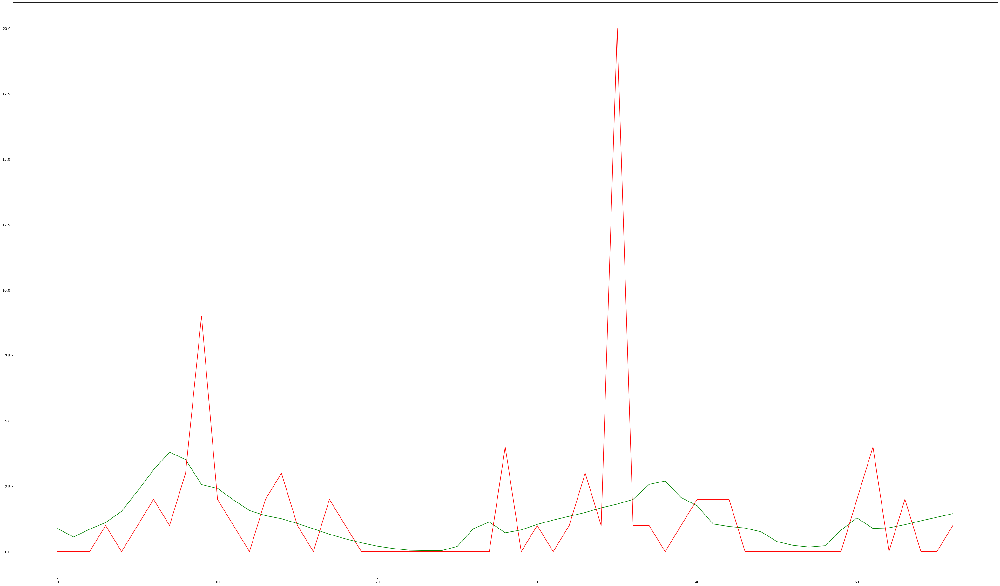

In [ ]:
from matplotlib.pyplot import figure

figure(figsize=(50, 30), dpi=80)

def plot_predictions2(model, X, y, start=0, end=100):
  predictions = model.predict(X).flatten()
  df = pd.DataFrame(data={'Predictions': predictions,
                          'Actuals':y.flatten()
                          })
  plt.plot(df['Predictions'][start:end], 'g')
  plt.plot(df['Actuals'][start:end], 'r')
  return df[start:end]
df_end = plot_predictions2(model4, X2_test_to_check, y2_test_to_check, end=len(y2_test_to_check))

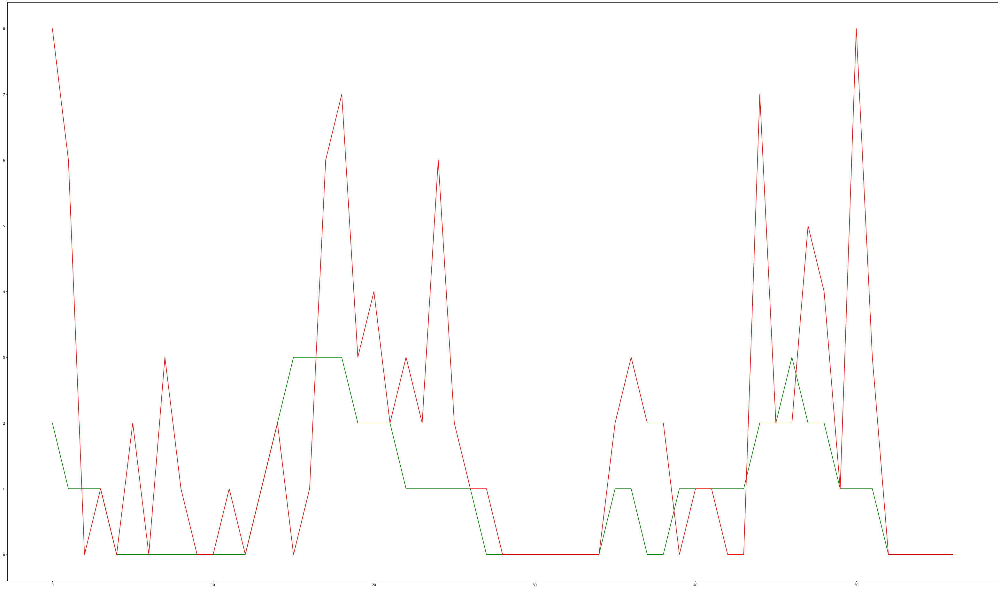

In [ ]:
from matplotlib.pyplot import figure

figure(figsize=(50, 30), dpi=80)

def plot_predictions2(model, X, y, start=0, end=100):
  predictions = model.predict(X).flatten()
  predictions = [int(i) for i in predictions]
  df = pd.DataFrame(data={'Predictions': predictions,
                          'Actuals':y.flatten()
                          })
  plt.plot(df['Predictions'][start:end], 'g')
  plt.plot(df['Actuals'][start:end], 'r')
  return df[start:end]
df_end = plot_predictions2(model4, X2_test_to_check, y2_test_to_check, end=len(y2_test_to_check))

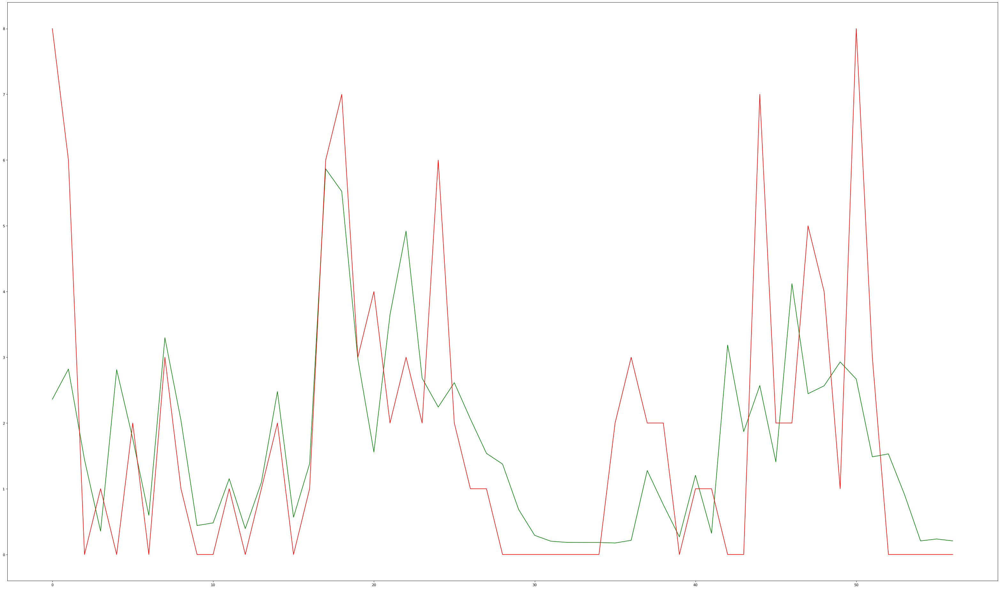

In [ ]:
from matplotlib.pyplot import figure

figure(figsize=(50, 30), dpi=80)

def plot_predictions2(model, X, y, start=0, end=100):
  predictions = model.predict(X).flatten()
  predictions = [i for i in predictions]
  df = pd.DataFrame(data={'Predictions': predictions,
                          'Actuals':y.flatten()
                          })
  plt.plot(df['Predictions'][start:end], 'g')
  plt.plot(df['Actuals'][start:end], 'r')
  return df[start:end]
df_end = plot_predictions2(model4, X2_test_to_check, y2_test_to_check, end=len(y2_test_to_check))

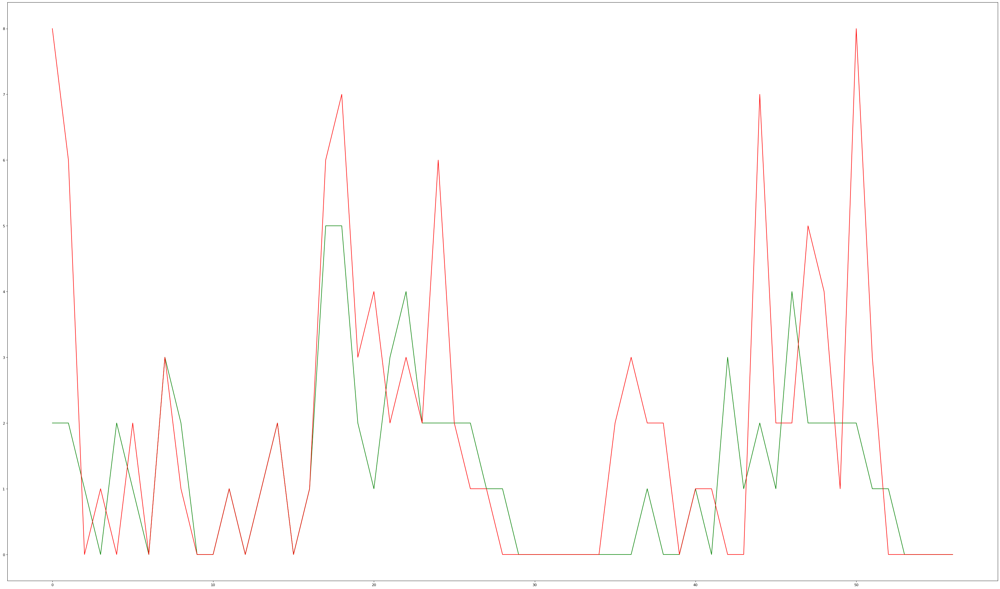

In [ ]:
from matplotlib.pyplot import figure

figure(figsize=(50, 30), dpi=80)

def plot_predictions2(model, X, y, start=0, end=100):
  predictions = model.predict(X).flatten()
  predictions = [int(i) for i in predictions]
  df = pd.DataFrame(data={'Predictions': predictions,
                          'Actuals':y.flatten()
                          })
  plt.plot(df['Predictions'][start:end], 'g')
  plt.plot(df['Actuals'][start:end], 'r')
  return df[start:end]
df_end = plot_predictions2(model4, X2_test_to_check, y2_test_to_check, end=len(y2_test_to_check))

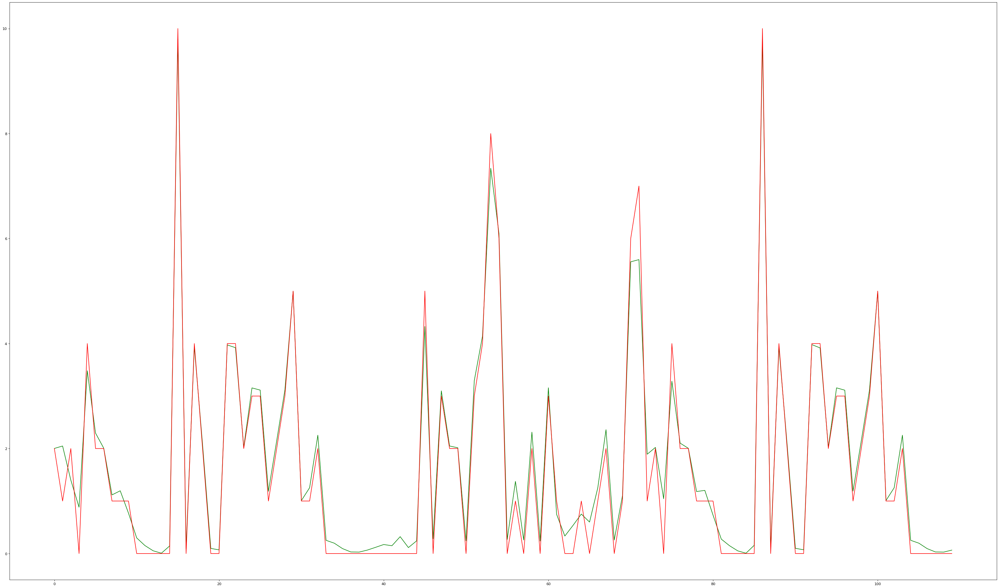

In [ ]:
from matplotlib.pyplot import figure

figure(figsize=(50, 30), dpi=80)

def plot_predictions2(model, Xv, X, yv, y, start=0, end=100):
  predictions = np.concatenate((model.predict(Xv).flatten(), model.predict(X).flatten()))
  predictions = [i for i in predictions]
  df = pd.DataFrame(data={'Predictions': predictions,
                          'Actuals':np.concatenate((yv.flatten(),y.flatten()))
                          })
  plt.plot(df['Predictions'][start:end], 'g')
  plt.plot(df['Actuals'][start:end], 'r')
  return df[start:end]
df_end = plot_predictions2(model4, X2_val_to_check, X2_test_to_check, y2_val_to_check, y2_test_to_check, end=len(y2_val_to_check)+len(y2_test_to_check))

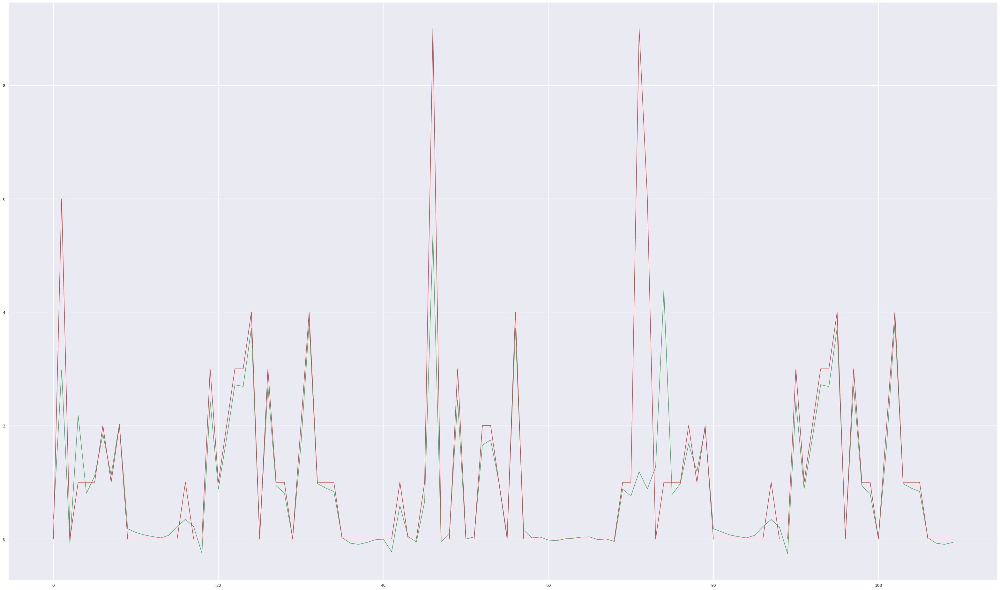

In [ ]:
from matplotlib.pyplot import figure

figure(figsize=(50, 30), dpi=80)

def plot_predictions2(model, Xv, X, yv, y, start=0, end=100):
  predictions = np.concatenate((model.predict(Xv).flatten(), model.predict(X).flatten()))
  predictions = [i for i in predictions]
  df = pd.DataFrame(data={'Predictions': predictions,
                          'Actuals':np.concatenate((yv.flatten(),y.flatten()))
                          })
  plt.plot(df['Predictions'][start:end], 'g')
  plt.plot(df['Actuals'][start:end], 'r')
  return df[start:end]
df_end = plot_predictions2(model4, X2_val_to_check, X2_test_to_check, y2_val_to_check, y2_test_to_check, end=len(y2_val_to_check)+len(y2_test_to_check))

In [ ]:
import xgboost as xgb
import numpy as np
from sklearn.decomposition import PCA
from xgboost import plot_importance, plot_tree
from sklearn.metrics import mean_squared_error, mean_absolute_error

In [ ]:
y = grouped_df.pop('diff')

KeyError: ignored

In [ ]:
pca_df = grouped_df.drop('Time', axis=1)

In [ ]:
from sklearn.preprocessing import StandardScaler
scalar = StandardScaler()
df_scaled = pd.DataFrame(scalar.fit_transform(pca_df), columns=pca_df.columns)
df_scaled

,Day,station_id,Month,Weekday,tavg,tmin,tmax,prcp,wdir,wspd,wpgt,pres
0,-1.578184,-0.524922,0.141128,1.500328,-0.625013,-1.360907,-0.003474,-0.353204,1.271500,-1.397038,-0.797852,0.663624
1,-1.578184,-0.524922,2.114496,-0.499791,0.963427,1.915860,0.581407,0.646246,-0.259820,-0.283672,-0.358222,-0.576056
2,-1.476684,-0.524922,0.141128,-1.499851,0.085605,-0.523511,0.201234,-0.353204,1.031906,-0.819737,-0.653973,0.087435
3,-1.476684,-0.524922,2.114496,0.000239,0.461814,1.187690,-0.003474,1.857701,0.167283,0.025596,-0.206349,0.244577
4,-1.375184,-0.524922,0.141128,-0.999821,-0.332406,-0.305060,-0.500623,-0.353204,0.854815,0.355482,0.385154,-0.383993
...,...,...,...,...,...,...,...,...,...,...,...,...
14649,1.263821,8.093318,-1.832240,0.500269,-1.126626,-1.615767,-0.559112,-0.353204,-1.197363,-1.273331,-0.797852,1.554099
14650,1.263821,8.093318,0.141128,1.500328,-0.499610,0.459519,-0.588356,-0.232058,0.115197,-0.263055,0.233281,-0.977643
14651,1.365321,8.093318,-1.832240,1.000299,-1.001223,-1.724993,-0.500623,-0.353204,0.886066,-1.129006,-0.653973,1.152512
14652,1.365321,8.093318,0.141128,-1.499851,-1.043024,-0.268651,-1.758118,5.280060,0.844397,-0.654794,-0.206349,-1.064944


In [ ]:
# initializing the pca
from sklearn import decomposition
pca = decomposition.PCA(n_components=12)
principalComponents = pca.fit_transform(df_scaled)

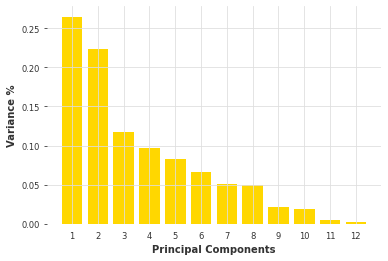

In [ ]:
PC = range(1, pca.n_components_+1)
plt.bar(PC, pca.explained_variance_ratio_, color='gold')
plt.xlabel('Principal Components')
plt.ylabel('Variance %')
plt.xticks(PC)

# Putting components in a dataframe for later
PCA_components = pd.DataFrame(principalComponents)

In [ ]:
pca_train_df = PCA_components.drop([8, 9, 10, 11], axis=1)

In [ ]:
pca_train_df.head()

,0,1,2,3,4,5,6,7
0,-0.741510,-1.936449,-1.562431,1.838532,-0.525813,-0.787869,0.317828,0.240559
1,2.902340,-0.551234,1.663885,0.924964,-0.535420,-0.673607,-0.394784,0.175816
2,0.021429,-1.477585,0.509369,0.793989,-0.530574,0.554052,-0.306470,1.796131
3,2.133067,-0.260809,1.544097,1.763350,-0.537096,-0.736422,1.073275,-0.161577
4,0.076555,0.112381,0.204616,0.419851,-0.531900,-0.252180,0.101861,1.936059


In [ ]:
df_scaled.head()

,Day,station_id,Month,Holiday,0,1,2,3,4,5,6
0,-1.578184,-1.727051,0.141128,4.471495,-1.966408,0.024702,-2.100365,0.833590,0.306650,0.278259,0.148958
1,-1.578184,-1.727051,2.114496,-0.223639,1.172390,-0.905794,1.394472,0.973801,0.867267,-0.206693,-0.488694
2,-1.476684,-1.727051,0.141128,-0.223639,-1.096808,-0.258499,0.332836,0.945344,-0.903502,-1.326874,-0.089019
3,-1.476684,-1.727051,2.114496,-0.223639,0.781025,0.062919,0.906851,1.370528,0.287145,1.111057,-0.738183
4,-1.375184,-1.727051,0.141128,4.471495,0.090036,0.840777,-0.023943,0.029054,-0.876911,-1.093934,-0.159238


In [ ]:
y

0        20.0
1        22.0
2        14.0
3        26.0
4        20.0
         ... 
14649     1.0
14650     3.0
14651     0.0
14652     5.0
14653     8.0
Name: diff, Length: 14654, dtype: float64

In [ ]:
X_test = df_scaled.loc[((grouped_df['Month'] == 5) & (grouped_df['Day'] > 28)) | (grouped_df['Month'] == 6)].copy()
X_train = df_scaled.loc[((grouped_df['Month'] == 5) & (grouped_df['Day'] <= 28)) | (grouped_df['Month'] <5) ].copy()

In [ ]:
y_test = y.loc[((grouped_df['Month'] == 5) & (grouped_df['Day'] > 28)) | (grouped_df['Month'] == 6)].copy()
y_train = y.loc[((grouped_df['Month'] == 5) & (grouped_df['Day'] <= 28)) | (grouped_df['Month'] <5) ].copy()

In [ ]:
len(data_train), len(data_test)

(12212, 2442)

In [ ]:
def create_features(df, label='diff'):
    X=df[['Day', 'station_id', 'Weekday', 'tavg', 'tmin', 'tmax', 'prcp', 'wdir', 'wspd', 'wpgt', 'pres']]
    if label:
        y = df[label]
        return X, y
    return X

In [ ]:
sorted(sklearn.metrics.SCORERS.keys())

['accuracy',
 'adjusted_mutual_info_score',
 'adjusted_rand_score',
 'average_precision',
 'balanced_accuracy',
 'completeness_score',
 'explained_variance',
 'f1',
 'f1_macro',
 'f1_micro',
 'f1_samples',
 'f1_weighted',
 'fowlkes_mallows_score',
 'homogeneity_score',
 'jaccard',
 'jaccard_macro',
 'jaccard_micro',
 'jaccard_samples',
 'jaccard_weighted',
 'max_error',
 'mutual_info_score',
 'neg_brier_score',
 'neg_log_loss',
 'neg_mean_absolute_error',
 'neg_mean_absolute_percentage_error',
 'neg_mean_gamma_deviance',
 'neg_mean_poisson_deviance',
 'neg_mean_squared_error',
 'neg_mean_squared_log_error',
 'neg_median_absolute_error',
 'neg_root_mean_squared_error',
 'normalized_mutual_info_score',
 'precision',
 'precision_macro',
 'precision_micro',
 'precision_samples',
 'precision_weighted',
 'r2',
 'rand_score',
 'recall',
 'recall_macro',
 'recall_micro',
 'recall_samples',
 'recall_weighted',
 'roc_auc',
 'roc_auc_ovo',
 'roc_auc_ovo_weighted',
 'roc_auc_ovr',
 'roc_auc_ovr_we

In [ ]:
X_train, y_train = create_features(data_train)
X_test, y_test = create_features(data_test)
X_train

,Day,station_id,Weekday,tavg,tmin,tmax,prcp,wdir,wspd,wpgt,pres
0,1,448565,6,12.2,4.0,19.0,0.0,348.0,5.9,20.4,1020.8
2,2,448565,0,13.9,6.3,19.7,0.0,325.0,8.7,22.2,1017.5
4,3,448565,1,12.9,6.9,17.3,0.0,308.0,14.4,35.2,1014.8
6,4,448565,2,13.0,9.8,17.0,0.0,56.0,10.7,25.9,1019.1
8,5,448565,3,14.6,8.0,22.0,0.0,126.0,15.8,31.5,1020.3
...,...,...,...,...,...,...,...,...,...,...,...
14646,27,55316960,4,13.6,8.0,17.4,1.5,253.0,18.5,40.8,1010.6
14647,28,55316960,3,10.8,4.0,16.1,0.0,31.0,8.3,27.8,1025.2
14648,28,55316960,5,9.8,8.0,14.0,1.0,252.0,20.8,44.5,1009.2
14649,29,55316960,4,11.0,3.3,17.1,0.0,111.0,6.5,20.4,1025.9


In [ ]:
X_train.drop('Month', axis=1, inplace=True)
X_test.drop('Month', axis=1, inplace=True)

In [ ]:
reg = xgb.XGBRegressor(learning_rate= 0.1, subsample= 0.9, max_depth=8,objective='reg:squarederror', n_estimators=10000, colsample_bytree=1)

In [ ]:
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=2000,
       verbose=True)

[0]	validation_0-rmse:30.1408	validation_1-rmse:33.5033
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 2000 rounds.
[1]	validation_0-rmse:27.6503	validation_1-rmse:31.4845
[2]	validation_0-rmse:25.4628	validation_1-rmse:29.5723
[3]	validation_0-rmse:23.5037	validation_1-rmse:27.8669
[4]	validation_0-rmse:21.7599	validation_1-rmse:26.422
[5]	validation_0-rmse:20.239	validation_1-rmse:25.1282
[6]	validation_0-rmse:18.9121	validation_1-rmse:24.0135
[7]	validation_0-rmse:17.7601	validation_1-rmse:22.9804
[8]	validation_0-rmse:16.7523	validation_1-rmse:22.1049
[9]	validation_0-rmse:15.9034	validation_1-rmse:21.2168
[10]	validation_0-rmse:15.134	validation_1-rmse:20.5925
[11]	validation_0-rmse:14.4217	validation_1-rmse:19.9252
[12]	validation_0-rmse:13.854	validation_1-rmse:19.3319
[13]	validation_0-rmse:13.3675	validation_1-rmse:18.9126
[14]	validation_0-rmse:12.9659	validation_1-rmse:18.406

XGBRegressor(max_depth=8, n_estimators=10000, objective='reg:squarederror',
             subsample=0.9)

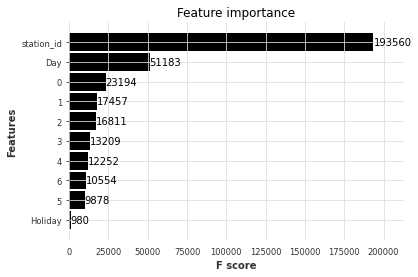

In [ ]:
_ = plot_importance(reg, height=0.9)

In [ ]:
data_all = pd.DataFrame({'predictions': reg.predict(X_test), 'true': y_test})

In [ ]:
data_all

,predictions,true
1,15.031580,22.0
3,15.861660,26.0
5,18.206659,41.0
7,16.232853,14.0
38,15.064161,18.0
...,...,...
14618,4.918637,7.0
14620,5.240832,0.0
14650,4.597444,3.0
14652,0.800433,5.0


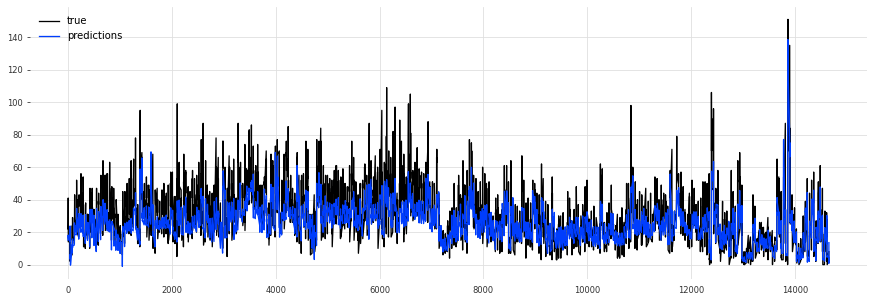

In [ ]:
_ = data_all[['true','predictions']].plot(figsize=(15, 5))

In [ ]:
data_diff = pd.DataFrame({'differences': reg.predict(X_test)-y_test})

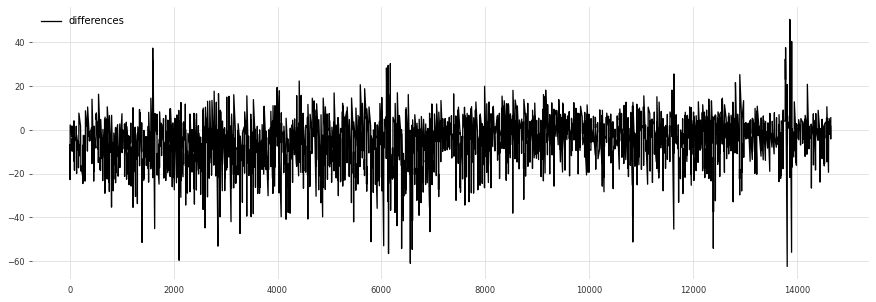

In [ ]:
_ = data_diff[['differences']].plot(figsize=(15, 5))

## 2. This whole statistics business thing

In [ ]:
del y 
del X2_train 
del X2_test
del X2_val

In [ ]:
del y2_test
del y2_val
del y2_train

In [ ]:
del X2_train_to_check
del X2_test_to_check
del X2_val_to_check

In [ ]:
del y2_test_to_check
del y2_val_to_check
del y2_train_to_check

In [ ]:
del model4

In [ ]:
import gc

gc.collect()

97007

In [ ]:
grouped_df = grouped_df.groupby(['station_id','date'])['bike_number'].sum().reset_index()
grouped_df[grouped_df['station_id']==2585982].head(50)

,station_id,date,bike_number
1365633,2585982,2022-04-24 15:44,9
1365634,2585982,2022-04-24 15:51,8
1365635,2585982,2022-04-24 16:21,10
1365636,2585982,2022-04-24 16:51,10
1365637,2585982,2022-04-24 17:18,9
1365638,2585982,2022-04-24 17:21,9
1365639,2585982,2022-04-24 17:39,7
1365640,2585982,2022-04-24 17:51,10
1365641,2585982,2022-04-24 18:21,19
1365642,2585982,2022-04-24 18:51,19


In [ ]:
json = requests.get("https://nextbike.net/maps/nextbike-official.json?city=372,210,475").json()
data = []
for city in json["countries"][0]['cities']:
    for place in city['places']:
        data.append({col: place[col] for col in ['uid', 'lat', 'lng', 'name','bike_racks']})
stations = pd.DataFrame(data)
stations.sort_values("bike_racks")

In [ ]:
grouped_df = pd.merge(grouped_df, stations, left_on='station_id', right_on='uid')
grouped_df.head()

,date,station_id,bike_number,uid,lat,lng,name,bike_racks
0,2022-04-24 15:44,448565,3,448565,52.183992,21.00984,Nestle House,15
1,2022-04-24 15:51,448565,4,448565,52.183992,21.00984,Nestle House,15
2,2022-04-24 16:21,448565,1,448565,52.183992,21.00984,Nestle House,15
3,2022-04-24 16:51,448565,5,448565,52.183992,21.00984,Nestle House,15
4,2022-04-24 17:21,448565,7,448565,52.183992,21.00984,Nestle House,15


In [ ]:
grouped_df.head()

,date,station_id,bike_number,uid,lat,lng,name,bike_racks
0,2022-04-24 15:44,448565,3,448565,52.183992,21.00984,Nestle House,15
1,2022-04-24 15:51,448565,4,448565,52.183992,21.00984,Nestle House,15
2,2022-04-24 16:21,448565,1,448565,52.183992,21.00984,Nestle House,15
3,2022-04-24 16:51,448565,5,448565,52.183992,21.00984,Nestle House,15
4,2022-04-24 17:21,448565,7,448565,52.183992,21.00984,Nestle House,15


In [ ]:
grouped_df["overflowing"] = grouped_df["bike_number"] / grouped_df["bike_racks"]
grouped_df["overflowing"] = grouped_df["overflowing"].astype(float)
grouped_df.head()

,date,station_id,bike_number,uid,lat,lng,name,bike_racks,overflowing
0,2022-04-24 15:44,448565,3,448565,52.183992,21.00984,Nestle House,15,0.200000
1,2022-04-24 15:51,448565,4,448565,52.183992,21.00984,Nestle House,15,0.266667
2,2022-04-24 16:21,448565,1,448565,52.183992,21.00984,Nestle House,15,0.066667
3,2022-04-24 16:51,448565,5,448565,52.183992,21.00984,Nestle House,15,0.333333
4,2022-04-24 17:21,448565,7,448565,52.183992,21.00984,Nestle House,15,0.466667


In [ ]:
grouped_df[grouped_df["bike_number"] - grouped_df["bike_racks"]>5]

,date,station_id,bike_number,Day,Month,Weekday,uid,lat,lng,name,bike_racks,overflowing
1678,2022-05-16 06:44,448565,21,16,5,0,448565,52.183992,21.009840,Nestle House,15,True
1679,2022-05-16 06:54,448565,21,16,5,0,448565,52.183992,21.009840,Nestle House,15,True
1680,2022-05-16 07:04,448565,22,16,5,0,448565,52.183992,21.009840,Nestle House,15,True
1681,2022-05-16 07:14,448565,22,16,5,0,448565,52.183992,21.009840,Nestle House,15,True
1682,2022-05-16 07:24,448565,21,16,5,0,448565,52.183992,21.009840,Nestle House,15,True
...,...,...,...,...,...,...,...,...,...,...,...,...
1541221,2022-05-30 02:54,2585781,24,30,5,0,2585781,52.198639,20.965252,Grójecka - PKP Rakowiec,18,True
1541222,2022-05-30 03:04,2585781,24,30,5,0,2585781,52.198639,20.965252,Grójecka - PKP Rakowiec,18,True
1541223,2022-05-30 03:14,2585781,24,30,5,0,2585781,52.198639,20.965252,Grójecka - PKP Rakowiec,18,True
1541224,2022-05-30 03:24,2585781,24,30,5,0,2585781,52.198639,20.965252,Grójecka - PKP Rakowiec,18,True


In [ ]:
grouped_df[grouped_df["bike_number"] - grouped_df["bike_racks"]>10]

,date,station_id,bike_number,Day,Month,Weekday,uid,lat,lng,name,bike_racks,overflowing
25255,2022-06-03 19:34,2585265,41,3,6,4,2585265,52.290173,20.950370,Marymoncka - Dewajtis,30,True
25256,2022-06-03 19:44,2585265,41,3,6,4,2585265,52.290173,20.950370,Marymoncka - Dewajtis,30,True
25257,2022-06-03 19:54,2585265,41,3,6,4,2585265,52.290173,20.950370,Marymoncka - Dewajtis,30,True
25258,2022-06-03 20:04,2585265,41,3,6,4,2585265,52.290173,20.950370,Marymoncka - Dewajtis,30,True
25259,2022-06-03 20:14,2585265,41,3,6,4,2585265,52.290173,20.950370,Marymoncka - Dewajtis,30,True
...,...,...,...,...,...,...,...,...,...,...,...,...
1535827,2022-05-23 15:24,2585776,38,23,5,0,2585776,52.209916,21.006779,al. Niepodległości - Batorego,26,True
1535828,2022-05-23 15:34,2585776,37,23,5,0,2585776,52.209916,21.006779,al. Niepodległości - Batorego,26,True
1535829,2022-05-23 15:44,2585776,40,23,5,0,2585776,52.209916,21.006779,al. Niepodległości - Batorego,26,True
1535830,2022-05-23 15:54,2585776,40,23,5,0,2585776,52.209916,21.006779,al. Niepodległości - Batorego,26,True


In [ ]:
grouped_df[grouped_df["bike_number"] - grouped_df["bike_racks"]>15]

,date,station_id,bike_number,Day,Month,Weekday,uid,lat,lng,name,bike_racks,overflowing
27790,2022-05-20 20:24,2585267,36,20,5,4,2585267,52.285914,20.940561,Metro Wawrzyszew,20,True
27791,2022-05-20 20:34,2585267,36,20,5,4,2585267,52.285914,20.940561,Metro Wawrzyszew,20,True
27792,2022-05-20 20:44,2585267,37,20,5,4,2585267,52.285914,20.940561,Metro Wawrzyszew,20,True
27793,2022-05-20 20:54,2585267,37,20,5,4,2585267,52.285914,20.940561,Metro Wawrzyszew,20,True
27794,2022-05-20 21:04,2585267,37,20,5,4,2585267,52.285914,20.940561,Metro Wawrzyszew,20,True
...,...,...,...,...,...,...,...,...,...,...,...,...
1534610,2022-05-14 15:54,2585776,42,14,5,5,2585776,52.209916,21.006779,al. Niepodległości - Batorego,26,True
1534611,2022-05-14 16:04,2585776,43,14,5,5,2585776,52.209916,21.006779,al. Niepodległości - Batorego,26,True
1534612,2022-05-14 16:14,2585776,48,14,5,5,2585776,52.209916,21.006779,al. Niepodległości - Batorego,26,True
1534613,2022-05-14 16:24,2585776,47,14,5,5,2585776,52.209916,21.006779,al. Niepodległości - Batorego,26,True


Plot stations on a map and add how much of a given day (on average) were they overflowing

In [ ]:
to_plot_df = grouped_df.groupby(['station_id', 'lat', 'lng', 'name'])['overflowing'].var().reset_index()
to_plot_df.head()

,station_id,lat,lng,name,overflowing
0,448565,52.183992,21.009840,Nestle House,0.097580
1,448566,52.177909,20.997491,New City,0.045633
2,1154451,52.230327,20.982705,Proximo,0.079642
3,2585259,52.296298,20.958358,Dewajtis - UKSW,0.063879
4,2585263,52.290974,20.929556,Metro Młociny,0.056026


In [ ]:
from shapely.geometry import Point
import geopandas as gpd
from geopandas import GeoDataFrame

station = [Point(xy) for xy in zip(to_plot_df['lng'], to_plot_df['lat'])]
gdf = GeoDataFrame(to_plot_df, geometry=geometry)   

#this is a simple map that goes with geopandas
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
gdf.plot(ax=world.plot(figsize=(10, 6)), marker='o', color='red', markersize=15);

NameError: ignored

In [ ]:
! pip install geopandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import osmnx as ox
from matplotlib.pyplot import figure

figure(figsize=(8, 6), dpi=80)
cities = [
"Warsaw, Poland"
]
sf = ox.graph_from_place(cities, network_type='drive')

<Figure size 640x480 with 0 Axes>

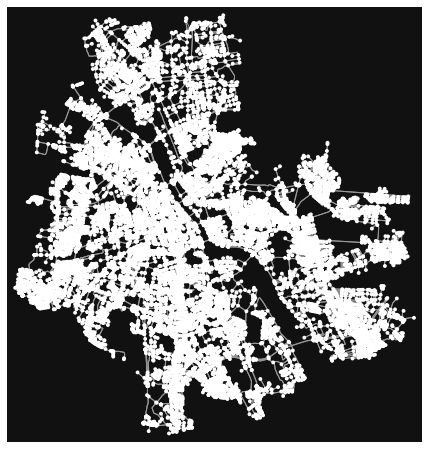

In [ ]:
fig, ax = ox.plot_graph(sf)

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point, Polygon

geometry_t = [Point(xy) for xy in zip(to_plot_df["lng"],to_plot_df["lat"])]
geo_df_t = gpd.GeoDataFrame(to_plot_df, geometry=geometry_t)

In [ ]:
! pip install momepy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 243 kB 5.0 MB/s 
     |████████████████████████████████| 2.4 MB 59.6 MB/s 
     |████████████████████████████████| 2.1 MB 43.3 MB/s 


In [ ]:
import momepy
nodes, edges, sw = momepy.nx_to_gdf(sf, points=True, lines=True,
                                    spatial_weights=True)

In [ ]:
!pip install folium matplotlib mapclassify

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install folium

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.0/95.0 kB 4.2 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.12.1.post1 which is incompatible.


In [ ]:
folium.__version__

NameError: ignored

In [ ]:
geo_df_t["x"] = geo_df_t["lng"]
geo_df_t["y"] = geo_df_t["lat"]

In [ ]:
geo_df_t.head()

,station_id,lat,lng,name,overflowing,geometry,x,y
0,448565,52.183992,21.009840,Nestle House,0.097580,POINT (21.00984 52.18399),21.009840,52.183992
1,448566,52.177909,20.997491,New City,0.045633,POINT (20.99749 52.17791),20.997491,52.177909
2,1154451,52.230327,20.982705,Proximo,0.079642,POINT (20.98270 52.23033),20.982705,52.230327
3,2585259,52.296298,20.958358,Dewajtis - UKSW,0.063879,POINT (20.95836 52.29630),20.958358,52.296298
4,2585263,52.290974,20.929556,Metro Młociny,0.056026,POINT (20.92956 52.29097),20.929556,52.290974


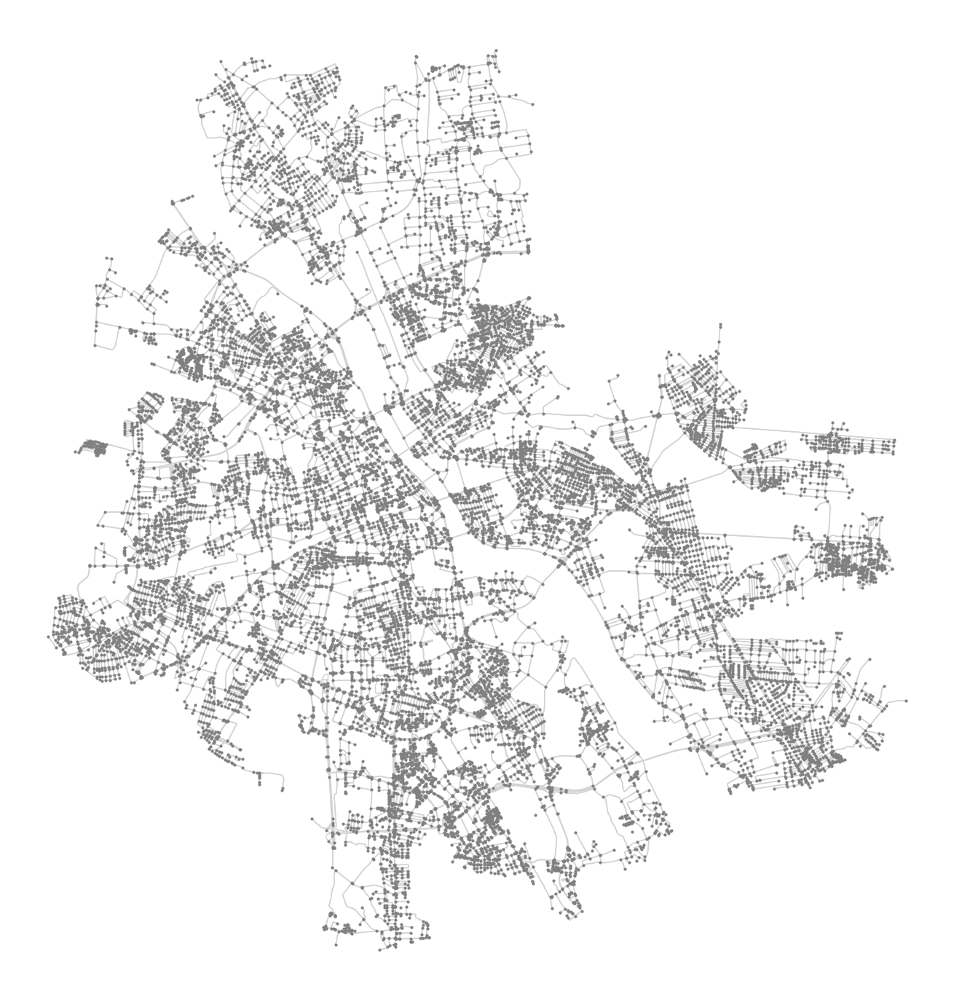

In [ ]:
f, ax = plt.subplots(figsize=(25, 25))
nodes.plot(ax=ax, markersize = 10, color='gray', zorder=2)
edges.plot(ax=ax, color='lightgrey', zorder=1)
geo_df_t.explore('name', color='red', legend=True)
ax.set_axis_off()
plt.show()

In [ ]:
import folium
m = geo_df_t.explore()
folium.TileLayer('Stamen Toner', control=True).add_to(m)  # use folium to add alternative tiles
folium.LayerControl().add_to(m)

NameError: ignored

In [ ]:
nodes.head()

,y,x,street_count,nodeID,highway,ref,geometry
0,52.152787,21.017454,5,0,NaN,NaN,POINT (21.01745 52.15279)
1,52.157570,20.991392,4,1,NaN,NaN,POINT (20.99139 52.15757)
2,52.166411,20.992301,3,2,NaN,NaN,POINT (20.99230 52.16641)
3,52.170803,20.992247,3,3,NaN,NaN,POINT (20.99225 52.17080)
4,52.176009,20.995157,3,4,NaN,NaN,POINT (20.99516 52.17601)


In [ ]:
import folium


addon = {"radius":0.000001, "fill":False}
m = nodes.explore( color='lightgrey',marker_kwds=addon, style_kwds={"fill":False}, tooltip=False)
geo_df_t.explore(column="overflowing",m=m, cmap='hot', marker_kwds={"radius":5, "fill":True},tooltip=["name", "overflowing"])
folium.TileLayer('Stamen Toner', control=True).add_to(m)  # use folium to add alternative tiles
folium.LayerControl().add_to(m)
m

In [ ]:
! pip install --upgrade pip

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 2.1 MB 5.1 MB/s 
  Attempting uninstall: pip
    Found existing installation: pip 21.1.3
    Uninstalling pip-21.1.3:
      Successfully uninstalled pip-21.1.3


In [ ]:
m.save(outfile= "test3.html")